In [1]:
# Mount on drive if using colab
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My\ Drive/ECE219/Project_2

Mounted at /content/drive
/content/drive/My Drive/ECE219/Project_2


In [2]:
import itertools
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
def plot_mat(mat, xticklabels = None, yticklabels = None, pic_fname = None, size=(-1,-1), if_show_values = True,
             colorbar = True, grid = 'k', xlabel = None, ylabel = None, title = None, vmin=None, vmax=None):
    if size == (-1, -1):
        size = (mat.shape[1] / 3, mat.shape[0] / 3)

    fig = plt.figure(figsize=size, dpi=300)
    ax = fig.add_subplot(1,1,1)

    # im = ax.imshow(mat, cmap=plt.cm.Blues)
    im = ax.pcolor(mat, cmap=plt.cm.Blues, linestyle='-', linewidth=0.5, edgecolor=grid, vmin=vmin, vmax=vmax)
    
    if colorbar:
        plt.colorbar(im,fraction=0.046, pad=0.06)
    # tick_marks = np.arange(len(classes))
    # Ticks
    lda_num_topics = mat.shape[0]
    nmf_num_topics = mat.shape[1]
    yticks = np.arange(lda_num_topics)
    xticks = np.arange(nmf_num_topics)
    ax.set_xticks(xticks + 0.5)
    ax.set_yticks(yticks + 0.5)
    if xticklabels is None:
        xticklabels = [str(i) for i in xticks]
    if yticklabels is None:
        yticklabels = [str(i) for i in yticks]
    ax.set_xticklabels(xticklabels)
    ax.set_yticklabels(yticklabels)

    # Minor ticks
    # ax.set_xticks(xticks, minor=True);
    # ax.set_yticks(yticks, minor=True);
    # ax.set_xticklabels([], minor=True)
    # ax.set_yticklabels([], minor=True)

    # ax.grid(which='minor', color='k', linestyle='-', linewidth=0.5)

    # tick labels on all four sides
    ax.tick_params(labelright = False, labeltop = False)

    if ylabel:
        plt.ylabel(ylabel, fontsize=15)
    if xlabel:
        plt.xlabel(xlabel, fontsize=15)
    if title:
        plt.title(title, fontsize=15)

    # im = ax.imshow(mat, interpolation='nearest', cmap=plt.cm.Blues)
    ax.invert_yaxis()

    # thresh = mat.max() / 2

    def show_values(pc, fmt="%d", **kw):
        pc.update_scalarmappable()
        ax = pc.axes
        for p, color, value in itertools.zip_longest(pc.get_paths(), pc.get_facecolors(), pc.get_array()):
            x, y = p.vertices[:-2, :].mean(0)
            if np.all(color[:3] > 0.5):
                color = (0.0, 0.0, 0.0)
            else:
                color = (1.0, 1.0, 1.0)
            ax.text(x, y, fmt % value, ha="center", va="center", color=color, **kw, fontsize=10)

    if if_show_values:
        show_values(im)
    # for i, j in itertools.product(range(mat.shape[0]), range(mat.shape[1])):
    #     ax.text(j, i, "{:.2f}".format(mat[i, j]), fontsize = 4,
    #              horizontalalignment="center",
    #              color="white" if mat[i, j] > thresh else "black")

    plt.tight_layout()
    if pic_fname:
        plt.savefig(pic_fname, dpi=300, transparent=True)
    plt.show()

# Dataset

In [3]:
from sklearn.datasets import fetch_20newsgroups

categories = ['comp.graphics', 'comp.os.ms-windows.misc', 'comp.sys.ibm.pc.hardware', 'comp.sys.mac.hardware', 
        'rec.autos', 'rec.motorcycles', 'rec.sport.baseball', 'rec.sport.hockey']

dataset = fetch_20newsgroups(subset='all', categories=categories, shuffle=True, random_state=42, remove=('headers', 'footers'))


# Part 1 - Clustering of Text Data

## Basic Workflow

### Question 1

In [4]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer

vectorizer = CountVectorizer(min_df=3, stop_words=None)
X_vec = vectorizer.fit_transform(dataset.data)

transformer = TfidfTransformer()
X_tfidf = transformer.fit_transform(X_vec)

labels = [0 if label<4 else 1 for label in dataset.target]

print('TF-IDF matrix dimension:', X_tfidf.shape)

TF-IDF matrix dimension: (7882, 23823)


### Question 2

In [5]:
from sklearn.cluster import KMeans

In [ ]:
km_2cluster = KMeans(n_clusters=2, random_state=0, max_iter=1000, n_init=30)
km_2cluster.fit(X_tfidf)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=1000,
       n_clusters=2, n_init=30, n_jobs=None, precompute_distances='auto',
       random_state=0, tol=0.0001, verbose=0)

In [6]:
from sklearn.metrics.cluster import contingency_matrix
from scipy.optimize import linear_sum_assignment

def plot_contingency_matrix(true_label, cluster_label,
              title = '',
              size = (6.5, 5),
              xticklabels = ['Cluster 1', 'Cluster 2'], 
              yticklabels = ['Computer\nTechnology', 'Recreational\nActivity'], 
              is_permuted = False):
  cm = contingency_matrix(true_label, cluster_label)

  xlabel = 'Clustering Result'
  ylabel = 'Ground Truth Label'

  if not is_permuted:
    plot_mat(cm, size = size, 
        xticklabels = xticklabels,
        yticklabels = yticklabels,
        xlabel = xlabel,
        ylabel = ylabel,
        title = 'Contingency Matrix of '+title)
  else:
    rows, cols = linear_sum_assignment(cm, maximize=True)
    plot_mat(cm[rows[:, np.newaxis], cols], 
        size = size, 
        xticklabels = cols, 
        yticklabels = rows, 
        xlabel = xlabel, 
        ylabel = ylabel, 
        title = 'Permuted Contingency Matrix of '+title)


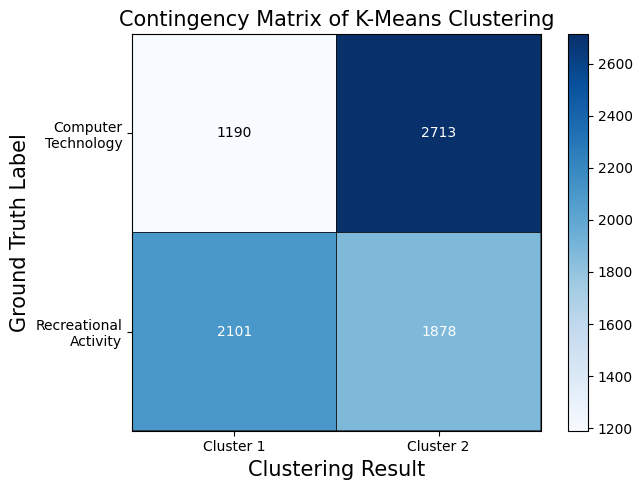

In [ ]:
plot_contingency_matrix(labels, km_2cluster.labels_, 'K-Means Clustering')

### Question 3

In [7]:
from sklearn.metrics import homogeneity_score, completeness_score, v_measure_score, adjusted_rand_score, adjusted_mutual_info_score

measurement_list = ['Homogeneity', 'Completeness', 'V-measure', 'Adjusted Rand Index', 'Adjusted Mutual Info']

def report_metrics(true_label, cluster_label, return_output=False, print_output=True):
  metrics = []
  metrics.append(homogeneity_score(true_label, cluster_label))
  metrics.append(completeness_score(true_label, cluster_label))
  metrics.append(v_measure_score(true_label, cluster_label))
  metrics.append(adjusted_rand_score(true_label, cluster_label))
  metrics.append(adjusted_mutual_info_score(true_label, cluster_label))

  if print_output:
    for i in range(5):
      print(measurement_list[i]+':\t%.6f' % metrics[i])

  if return_output:
    return metrics

In [ ]:
report_metrics(labels, km_2cluster.labels_)

Homogeneity:	0.037295
Completeness:	0.038042
V-measure:	0.037665
Adjusted Rand Index:	0.048950
Adjusted Mutual Info:	0.037576


## Dimensionality Reduction

### Question 4

In [8]:
from sklearn.decomposition import TruncatedSVD

In [ ]:
r_max = 1000
svd = TruncatedSVD(n_components=r_max, random_state=42)
_ = svd.fit_transform(X_tfidf)

array([[ 0.33284196, -0.02214586, -0.04519218, ..., -0.00838812,
         0.00675797,  0.00695288],
       [ 0.30240906, -0.04428785,  0.03302885, ...,  0.00836452,
         0.02376671,  0.0262138 ],
       [ 0.33549228, -0.11854466,  0.07677139, ...,  0.00863063,
        -0.00714943, -0.00820101],
       ...,
       [ 0.18052605, -0.0352662 , -0.04697472, ...,  0.00657742,
        -0.05042002,  0.02988038],
       [ 0.27854502, -0.02654771, -0.03796395, ..., -0.01604623,
         0.02480539, -0.01077695],
       [ 0.2191398 ,  0.01667705, -0.03005204, ..., -0.00996063,
         0.00355769, -0.0171723 ]])

In [ ]:
variance_percentage = [0] * len(svd.explained_variance_ratio_)
for i in range(len(svd.explained_variance_ratio_)):
  variance_percentage[i] = sum(svd.explained_variance_ratio_[:i+1])

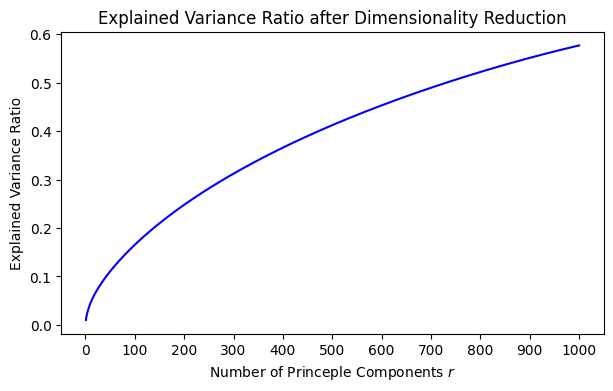

In [ ]:
fig = plt.figure(figsize=(7,4), dpi=100)
ax = fig.add_subplot(1,1,1)
ax.plot(range(1, r_max+1, 1), variance_percentage, color='b')
ax.set_xticks(range(0, r_max+1, 100))
ax.set_xlabel('Number of Princeple Components $r$')
ax.set_ylabel('Explained Variance Ratio')
ax.set_title('Explained Variance Ratio after Dimensionality Reduction')
plt.show()

### Question 5

In [9]:
r_list = [1, 2, 3, 5, 10, 20, 50, 100, 300]

In [130]:
def plot_measure_scores(metrics, title, xticklabels = r_list, xlabel = ''):
  fig = plt.figure(figsize=(6,4), dpi=100)
  ax = fig.add_subplot(1,1,1)

  color_list = ['b', 'g', 'r', 'c', 'm']
  for i in range(5):
    ax.plot(np.arange(np.matrix(metrics).shape[0]), np.array(metrics)[:,i], color = color_list[i], label = measurement_list[i])

  if xlabel == '':
    ax.set_xlabel('Number of Princeple Component $r$')
  else:
    ax.set_xlabel(xlabel)
  # ax.set_xticklabels(np.insert(np.array(xticklabels),0,0))
  ax.set_xticklabels(list(xticklabels))
  ax.set_xticks(np.arange(np.matrix(metrics).shape[0]))
  ax.set_ylabel('Measure Score')
  ax.set_title('Measure Scores for ' + title)
  ax.legend()

  plt.show()

In [ ]:
# SVD
metrics_SVD = []
for r in r_list:
  svd_tmp = TruncatedSVD(n_components=r, random_state=42)
  X_svd_tmp = svd_tmp.fit_transform(X_tfidf)

  km_tmp = KMeans(n_clusters=2, random_state=0, max_iter=1000, n_init=30)
  km_tmp.fit(X_svd_tmp)
  metrics_SVD.append(report_metrics(labels, km_tmp.labels_, True, False))

print(np.array(metrics_SVD))

[[0.00234995 0.00236646 0.00235818 0.00299008 0.00226652]
 [0.06113677 0.06388315 0.06247979 0.07680262 0.06239207]
 [0.03775939 0.03868303 0.03821563 0.04917547 0.03812651]
 [0.04346566 0.04450449 0.04397894 0.05665127 0.04389038]
 [0.0340506  0.03488352 0.03446203 0.04434184 0.03437256]
 [0.03383315 0.03458397 0.03420444 0.04423478 0.03411505]
 [0.0337347  0.03451995 0.03412281 0.0440213  0.03403336]
 [0.03382043 0.03461    0.03421066 0.044128   0.03412122]
 [0.03387    0.03468897 0.0342746  0.04412804 0.03418513]]


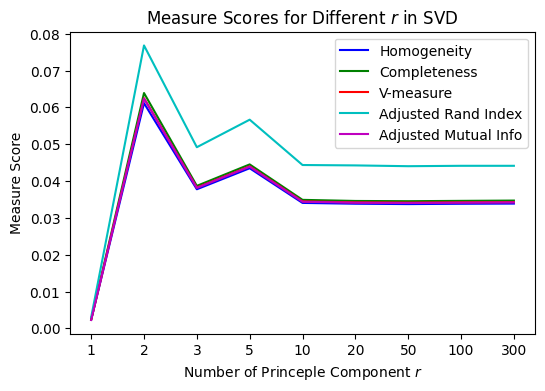

In [ ]:
plot_measure_scores(metrics_SVD, 'Different $r$ in SVD')

In [11]:
# NMF
from sklearn.decomposition import NMF

In [ ]:
metrics_NMF = []
for r in r_list:
  nmf_tmp = NMF(n_components=r, random_state=42)
  X_nmf_tmp = nmf_tmp.fit_transform(X_tfidf)

  km_tmp = KMeans(n_clusters=2, random_state=0, max_iter=1000, n_init=30)
  km_tmp.fit(X_nmf_tmp)
  metrics_NMF.append(report_metrics(labels, km_tmp.labels_, True, False))

print(np.array(metrics_NMF))

[[2.34995459e-03 2.36645551e-03 2.35817618e-03 2.99008448e-03
  2.26652200e-03]
 [4.39024667e-01 4.40421927e-01 4.39722187e-01 5.41049349e-01
  4.39670812e-01]
 [4.79603145e-01 4.83951449e-01 4.81767485e-01 5.76328292e-01
  4.81719827e-01]
 [3.97495028e-01 4.10117691e-01 4.03707716e-01 4.68260114e-01
  4.03652271e-01]
 [1.75218096e-01 2.76363994e-01 2.14463655e-01 9.51031877e-02
  2.14375610e-01]
 [1.03883695e-01 2.24034335e-01 1.41947148e-01 4.18302980e-02
  1.41839757e-01]
 [1.28771956e-03 9.17294266e-02 2.53978501e-03 5.52047164e-05
  2.34879329e-03]
 [1.28771956e-03 9.17294266e-02 2.53978501e-03 5.52047164e-05
  2.34879329e-03]
 [8.73628656e-04 2.22584381e-03 1.25476897e-03 5.59141503e-06
  1.12335380e-03]]


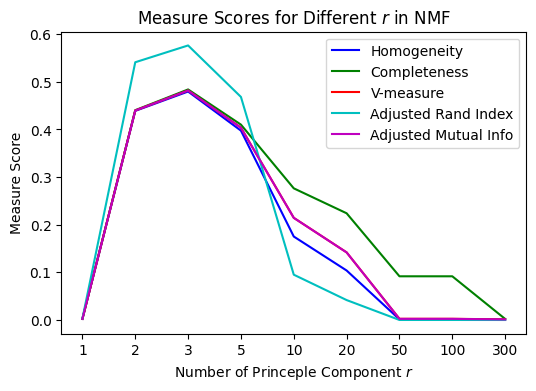

In [ ]:
plot_measure_scores(metrics_NMF, 'Different $r$ in NMF')

## Visualization

### Question 7

In [207]:
from sklearn.decomposition import PCA

def visualize(cluster_model, decompose_model, is_groundtruth = False, title = '', data = X_tfidf, labels = labels):
  if decompose_model != None:
    data = decompose_model.fit_transform(data)

  if is_groundtruth:
    title = 'Visualization of Ground Truth Clustering' + title
  else:
    title = 'Visualization of Clustering using ' + title
    if cluster_model != None:
      cluster_model.fit(data)
      labels = cluster_model.labels_

  visual_model = PCA(n_components=2, random_state=42)
  projection = visual_model.fit_transform(data)
  
  color_list = ['r', 'b', 'g', 'c', 'm']
  def generate_color(label_list):
    return list(map(lambda x: color_list[x], label_list))

  fig = plt.figure(dpi=100)
  ax = fig.add_subplot(1,1,1)

  label_count = len(np.unique(labels))
  if label_count <= 5:
    plt.scatter(projection[:,0], projection[:,1], marker='.', c=generate_color(labels), alpha=0.8, s=5)
  else:
    plt.scatter(projection[:,0], projection[:,1], marker='.', c=labels, cmap='hsv', alpha=0.8, s=5)
    plt.colorbar(boundaries=np.arange(label_count+1)-0.5).set_ticks(np.arange(label_count))
  ax.set_title(title)
  plt.axis('square')
  plt.tight_layout()
  plt.show()


In [ ]:
# best r for SVD
print(np.argmax(metrics_SVD, axis=0))

r_svd_best = r_list[int(np.bincount(np.argmax(metrics_SVD, axis=0)).argmax())]
print('Best r for SVD: ' + str(r_svd_best))

[1 1 1 1 1]
Best r for SVD: 2


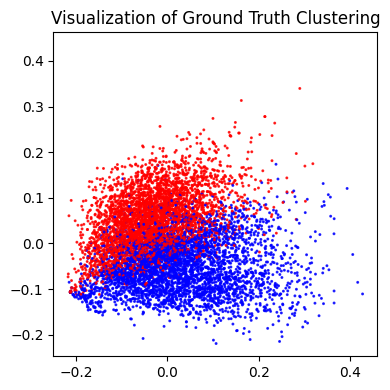

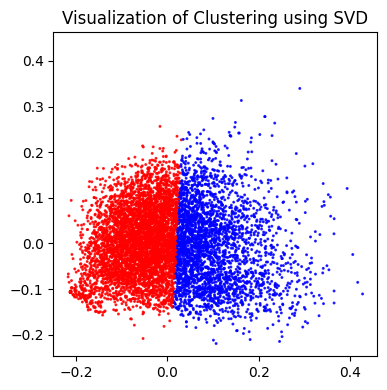

In [ ]:
# SVD visualization
km_svd = KMeans(n_clusters=2, random_state=0, max_iter=1000, n_init=30)
best_svd = TruncatedSVD(n_components=r_svd_best, random_state=42)

visualize(km_svd, best_svd, True)
visualize(km_svd, best_svd, False, 'SVD')

In [ ]:
# best r for NMF
print(np.argmax(metrics_NMF, axis=0))

r_nmf_best = r_list[int(np.bincount(np.argmax(metrics_NMF, axis=0)).argmax())]
print('Best r for NMF: ' + str(r_nmf_best))

[2 2 2 2 2]
Best r for NMF: 3


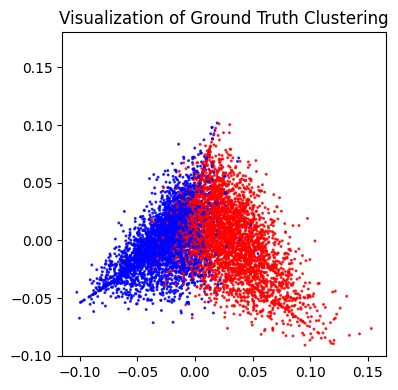

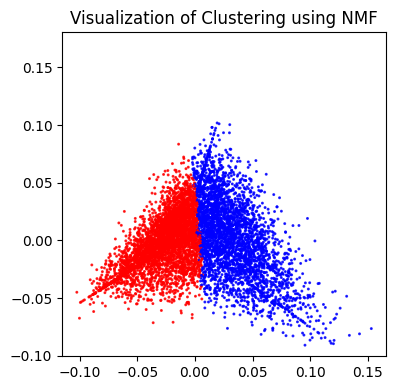

In [ ]:
# NMF visualization
km_nmf = KMeans(n_clusters=2, random_state=0, max_iter=1000, n_init=30)
best_nmf = NMF(n_components=r_nmf_best, random_state=42)

visualize(km_nmf, best_nmf, True)
visualize(km_nmf, best_nmf, False, 'NMF')

## More challenging clustering

### Question 9

In [13]:
dataset_full = fetch_20newsgroups(subset='all', shuffle=True, random_state=42, remove=('headers', 'footers'))

X_vec_full = CountVectorizer(min_df=3, stop_words=None).fit_transform(dataset_full.data)
X_tfidf_full = TfidfTransformer().fit_transform(X_vec_full)

print(X_tfidf_full.shape)

(18846, 45674)


In [126]:
def search_best_r(decompose_method, r_list = r_list, data = X_tfidf, n_clusters = 2, true_label = labels, title = ''):
  metrics_all = []
  for r in r_list:
    if decompose_method == 'svd' or decompose_method == 'SVD':
      decompose_model = TruncatedSVD(n_components=r, random_state=42)
    elif decompose_method == 'nmf' or decompose_method == 'NMF':
      decompose_model = NMF(n_components=r, random_state=42)
    
    X_reduced = decompose_model.fit_transform(data)

    km_model = KMeans(n_clusters=n_clusters, random_state=0, max_iter=1000, n_init=30)
    km_model.fit(X_reduced)
    metrics_all.append(report_metrics(true_label, km_model.labels_, True, False))
    print('r=%d is done.' % r)

  print(np.array(metrics_all))

  if title == '':
    title = decompose_method.upper()
  plot_measure_scores(metrics_all, 'Different $r$ in ' + title, xticklabels = r_list)
  
  print(np.argmax(metrics_all, axis=0))
  r_best = r_list[int(np.bincount(np.argmax(metrics_all, axis=0)).argmax())]
  print('Best r for ' + title + ': ' + str(r_best))
  print('Best measures: ' + str(metrics_all[int(np.bincount(np.argmax(metrics_all, axis=0)).argmax())]))
  return metrics_all

In [144]:
def measure_model(cluster_model, data, title_visual, title_contingency, true_label=dataset_full.target, size = (15, 15)):
  cluster_model.fit(data)
  report_metrics(true_label, cluster_model.labels_)

  visualize(None, None, is_groundtruth=True, data=data, labels=true_label)
  visualize(None, None, is_groundtruth=False, title=title_visual, data=data, labels=cluster_model.labels_)

  plot_contingency_matrix(true_label, cluster_model.labels_, 
              title = title_contingency, 
              size = size, 
              xticklabels = '', 
              yticklabels = '', 
              is_permuted = True)
  return cluster_model

r=1 is done.
r=2 is done.
r=3 is done.
r=5 is done.
r=10 is done.
r=20 is done.
r=50 is done.
r=100 is done.
r=300 is done.
[[0.03922008 0.04095748 0.04006995 0.00922844 0.0368904 ]
 [0.11808565 0.12222777 0.12012101 0.03504067 0.11722869]
 [0.14798531 0.15288857 0.15039698 0.0458993  0.14760743]
 [0.16913086 0.17562023 0.17231447 0.05728907 0.16958981]
 [0.20882383 0.21811389 0.21336779 0.07486096 0.21077093]
 [0.22910184 0.24009677 0.23447048 0.08503066 0.23193914]
 [0.26001401 0.28470386 0.27179939 0.09665935 0.2693314 ]
 [0.25013219 0.27496377 0.26196084 0.09201752 0.25945381]
 [0.25135132 0.29423961 0.27110976 0.07417541 0.26854683]]
[6 8 6 6 6]
Best r for SVD: 50


50

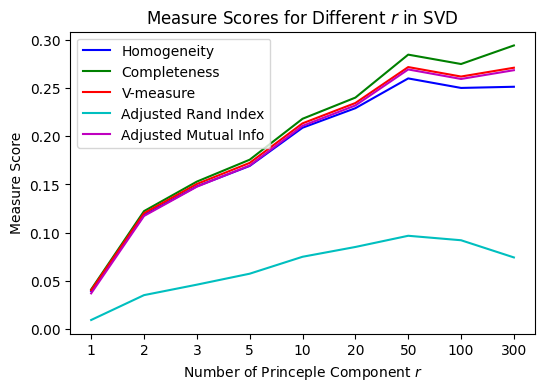

In [ ]:
_ = search_best_r('svd', r_list=r_list, data=X_tfidf_full, n_clusters=20, true_label=dataset_full.target)

r=20 is done.
r=30 is done.
r=40 is done.
r=50 is done.
r=60 is done.
r=70 is done.
r=80 is done.
r=90 is done.
r=100 is done.
[[0.22910184 0.24009677 0.23447048 0.08503066 0.23193914]
 [0.25339908 0.26729538 0.26016179 0.09728221 0.25770698]
 [0.2432656  0.26691861 0.25454381 0.08716863 0.25201593]
 [0.26001401 0.28470386 0.27179939 0.09665935 0.2693314 ]
 [0.24947521 0.27350866 0.26093971 0.09268689 0.25843401]
 [0.26068222 0.29401382 0.27634657 0.09010951 0.27385405]
 [0.25681881 0.29903429 0.27632348 0.08893888 0.27378417]
 [0.24660969 0.27905517 0.26183112 0.07984513 0.25928638]
 [0.25013219 0.27496377 0.26196084 0.09201752 0.25945381]]


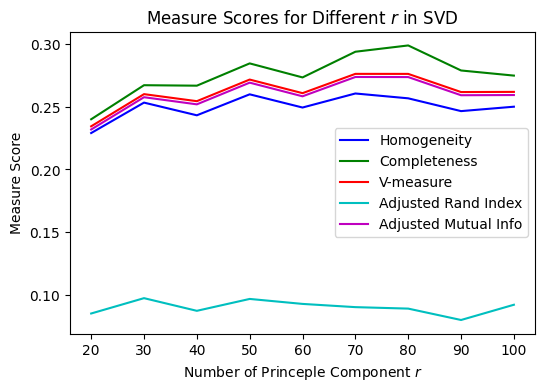

[5 6 5 1 5]
Best r for SVD: 70


70

In [ ]:
# Fine tune best r for SVD on full dataset
_ = search_best_r('svd', r_list=np.arange(20,110,10), data=X_tfidf_full, n_clusters=20, true_label=dataset_full.target)

r=1 is done.
r=2 is done.
r=3 is done.
r=5 is done.
r=10 is done.
r=20 is done.
r=50 is done.
r=100 is done.
r=300 is done.
[[0.03922008 0.04095748 0.04006995 0.00922844 0.0368904 ]
 [0.0878105  0.09109277 0.08942153 0.0267202  0.08642443]
 [0.15819501 0.16287544 0.16050111 0.04840617 0.15775005]
 [0.17851017 0.18667664 0.18250209 0.06317471 0.17980167]
 [0.20774178 0.21747463 0.21249681 0.07749353 0.20989321]
 [0.2494815  0.26592074 0.25743895 0.09404397 0.25496175]
 [0.17453255 0.2330086  0.19957536 0.03878782 0.19658155]
 [0.13206062 0.18399856 0.15376212 0.03047174 0.15050342]
 [0.07945782 0.11498101 0.09397444 0.01501033 0.09039319]]
[5 5 5 5 5]
Best r for NMF: 20


20

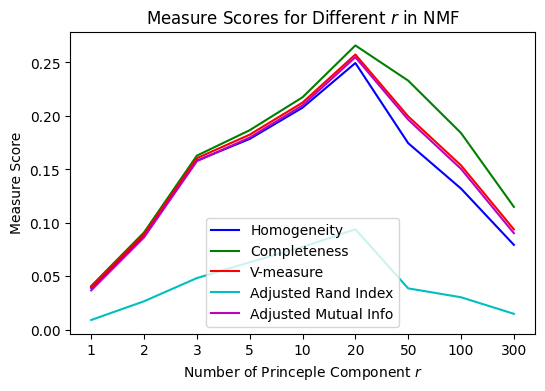

In [ ]:
_ = search_best_r('nmf', r_list=r_list, data=X_tfidf_full, n_clusters=20, true_label=dataset_full.target)

r=10 is done.
r=15 is done.
r=20 is done.
r=25 is done.
r=30 is done.
r=35 is done.
r=40 is done.
r=45 is done.
r=50 is done.
[[0.20774178 0.21747463 0.21249681 0.07749353 0.20989321]
 [0.23415151 0.24873423 0.24122268 0.08661494 0.23869407]
 [0.2494815  0.26592074 0.25743895 0.09404397 0.25496175]
 [0.2516516  0.27138184 0.26114458 0.0880238  0.25866618]
 [0.28290821 0.3304712  0.30484563 0.09012991 0.30241157]
 [0.22388363 0.27595772 0.2472081  0.05996949 0.24450514]
 [0.21482023 0.2830468  0.24425871 0.05207292 0.24145841]
 [0.17486874 0.23649352 0.20106523 0.03620905 0.19806591]
 [0.17453255 0.2330086  0.19957536 0.03878782 0.19658155]]


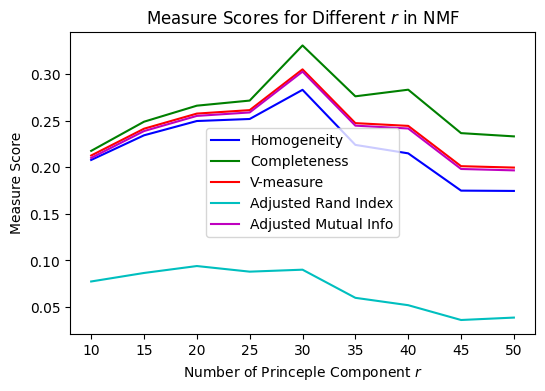

[4 4 4 2 4]
Best r for NMF: 30


30

In [ ]:
# Fine tune best r for NMF on full dataset
_ = search_best_r('nmf', r_list=np.arange(10,55,5), data=X_tfidf_full, n_clusters=20, true_label=dataset_full.target)

In [ ]:
# the best dimensionality reduction method: NMF (r=30)

best_full = NMF(n_components=30, random_state=42)
X_reduced_full = best_full.fit_transform(X_tfidf_full)

km_full = KMeans(n_clusters=20, random_state=0, max_iter=1000, n_init=30)
km_full.fit(X_reduced_full)
report_metrics(dataset_full.target, km_full.labels_)


Homogeneity:	0.282908
Completeness:	0.330471
V-measure:	0.304846
Adjusted Rand Index:	0.090130
Adjusted Mutual Info:	0.302412


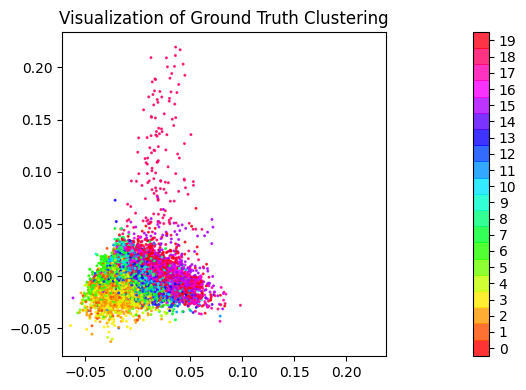

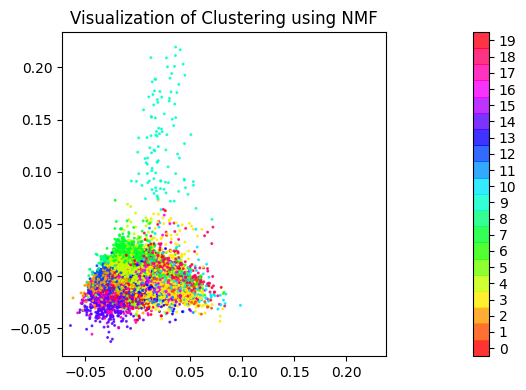

In [ ]:
visualize(None, None, is_groundtruth=True, data=X_reduced_full, labels=dataset_full.target)
visualize(None, None, is_groundtruth=False, title='NMF', data=X_reduced_full, labels=km_full.labels_)


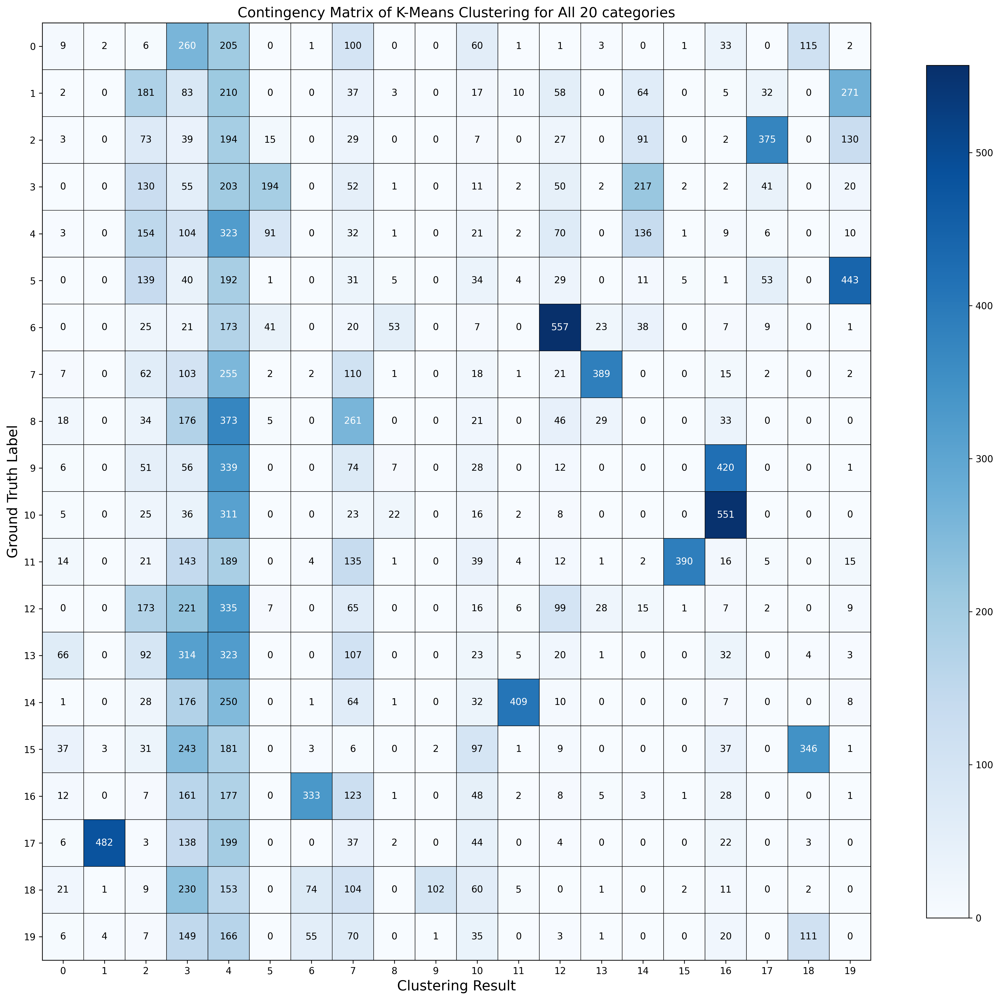

In [ ]:
plot_contingency_matrix(dataset_full.target, km_full.labels_, 
            size = (15,15),
            title = 'K-Means Clustering for All 20 categories',
            xticklabels = np.arange(0,20),
            yticklabels = np.arange(0,20))

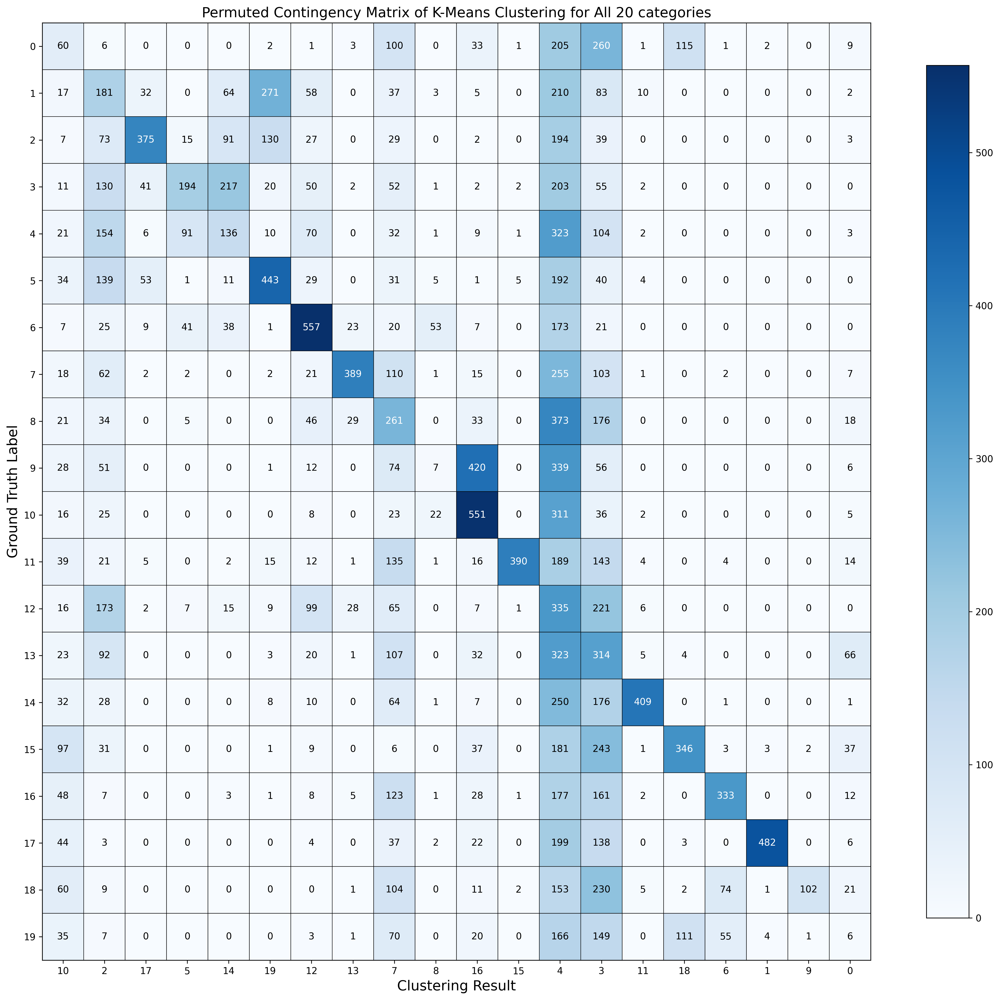

In [ ]:
plot_contingency_matrix(dataset_full.target, km_full.labels_, 
            size = (15,15),
            title = 'K-Means Clustering for All 20 categories',
            xticklabels = '',
            yticklabels = '',
            is_permuted = True)

### Question 10

In [127]:
def search_best_r_KLDivergence(r_list = r_list, data = X_tfidf_full, n_clusters = 20, true_label = dataset_full.target, title = ''):
  metrics_all = []
  for r in r_list:
    decompose_model = NMF(n_components=r, random_state=42, beta_loss='kullback-leibler', solver='mu')
    X_reduced = decompose_model.fit_transform(data)

    km_model = KMeans(n_clusters=n_clusters, random_state=0, max_iter=1000, n_init=30)
    km_model.fit(X_reduced)
    metrics_all.append(report_metrics(true_label, km_model.labels_, True, False))
    print('r=%d is done.' % r)

  print(np.array(metrics_all))
  plot_measure_scores(metrics_all, 'Different $r$ in ' + title, xticklabels = r_list)
  
  print(np.argmax(metrics_all, axis=0))
  r_best = r_list[int(np.bincount(np.argmax(metrics_all, axis=0)).argmax())]
  print('Best r for ' + title + ': ' + str(r_best))
  print('Best measures: ' + str(metrics_all[int(np.bincount(np.argmax(metrics_all, axis=0)).argmax())]))
  return metrics_all

r=1 is done.
r=2 is done.
r=3 is done.
r=5 is done.
r=10 is done.
r=20 is done.
r=50 is done.
r=100 is done.
r=300 is done.
[[0.02773954 0.03052802 0.02906706 0.00611762 0.02573886]
 [0.16270224 0.18154446 0.17160769 0.04590665 0.16877823]
 [0.20600955 0.22342866 0.21436582 0.06728021 0.21170251]
 [0.29875682 0.32211391 0.30999602 0.1186028  0.30766295]
 [0.36081385 0.37846263 0.36942757 0.17537059 0.36733285]
 [0.4295755  0.43956285 0.43451179 0.23598883 0.43266541]
 [0.34307337 0.4741814  0.39811089 0.0659522  0.3958414 ]
 [0.26217805 0.4724212  0.33721371 0.02797191 0.33443195]
 [0.10608244 0.39968595 0.16766433 0.0056036  0.16319975]]


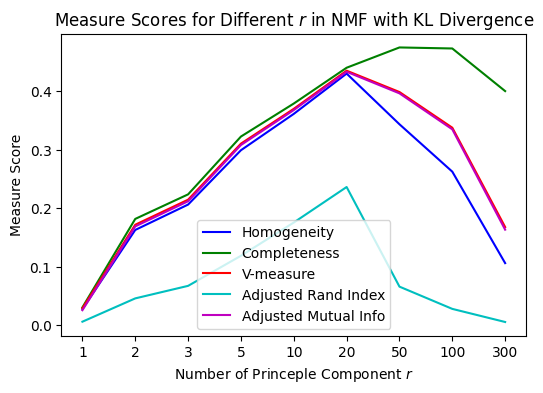

[5 6 5 5 5]
Best r for NMF with KL Divergence: 20


20

In [ ]:
_ = search_best_r_KLDivergence(data=X_tfidf_full, n_clusters=20, true_label=dataset_full.target, title='NMF with KL Divergence')

Homogeneity:	0.429575
Completeness:	0.439563
V-measure:	0.434512
Adjusted Rand Index:	0.235989
Adjusted Mutual Info:	0.432665


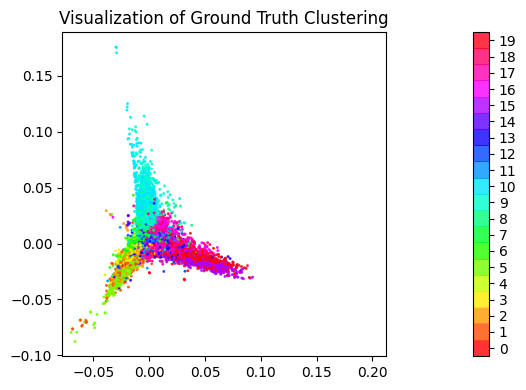

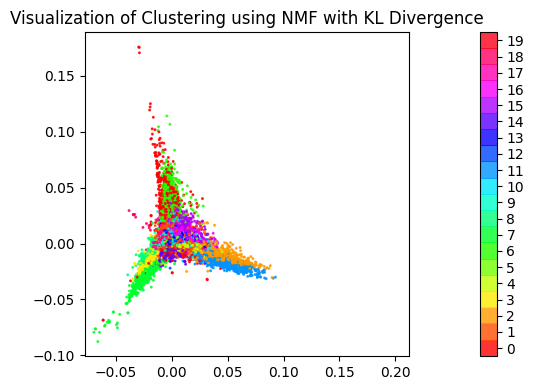

In [ ]:
### Best r for NMF with KL Divergence: r=20

best_full_KL = NMF(n_components=20, random_state=42, beta_loss='kullback-leibler', solver='mu')
X_reduced_full_KL = best_full_KL.fit_transform(X_tfidf_full)

km_full_KL = KMeans(n_clusters=20, random_state=0, max_iter=1000, n_init=30)
km_full_KL.fit(X_reduced_full_KL)
report_metrics(dataset_full.target, km_full_KL.labels_)

visualize(None, None, is_groundtruth=True, data=X_reduced_full_KL, labels=dataset_full.target)
visualize(None, None, is_groundtruth=False, title='NMF with KL Divergence', data=X_reduced_full_KL, labels=km_full_KL.labels_)

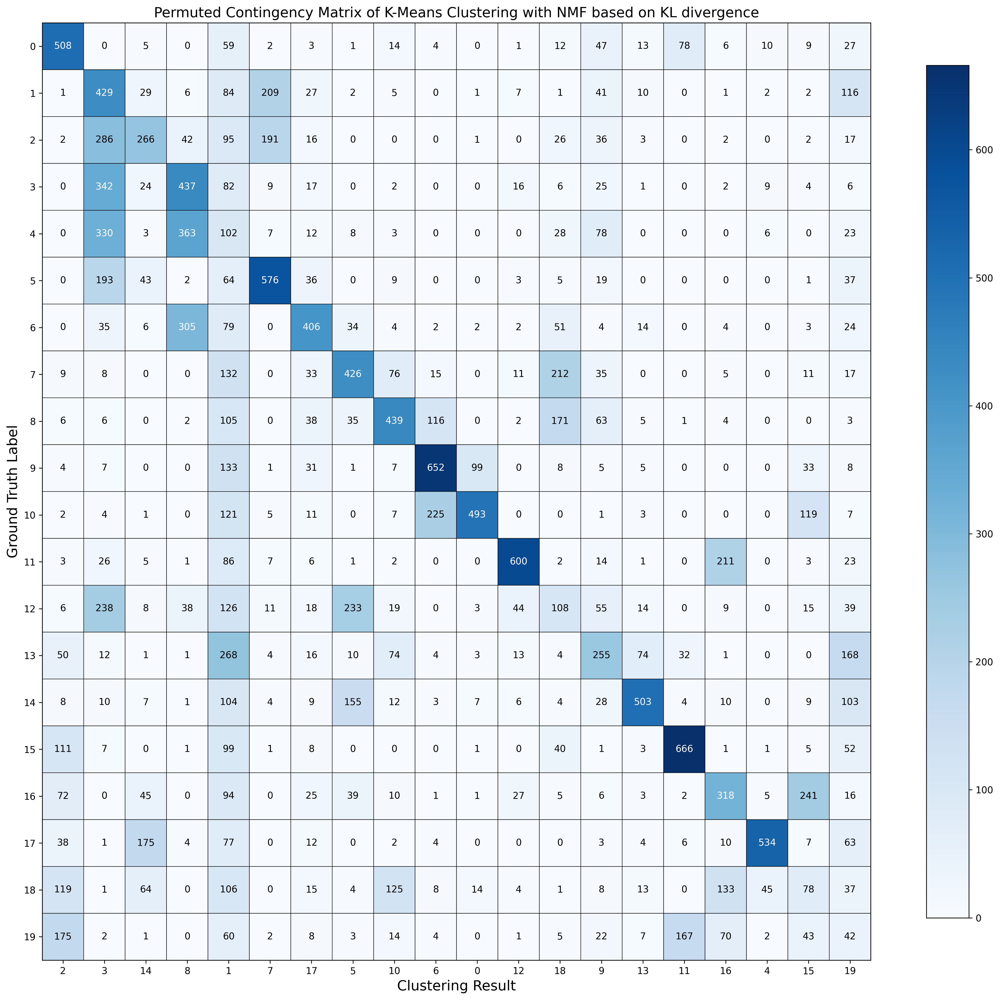

In [ ]:
plot_contingency_matrix(dataset_full.target, km_full_KL.labels_,
            title = 'K-Means Clustering with NMF based on KL divergence',
            size = (15, 15), 
            xticklabels = '',
            yticklabels = '',
            is_permuted = True)

## UMAP

### Question 11

In [16]:
from umap import UMAP

In [128]:
def search_best_r_umap(r_list = r_list, data = X_tfidf_full, n_clusters = 20, true_label = dataset_full.target, title = '', metric='euclidean'):
  metrics_all = []
  for r in r_list:
    decompose_model = UMAP(n_components=r, random_state=42, metric=metric)
    X_reduced = decompose_model.fit_transform(data)

    km_model = KMeans(n_clusters=n_clusters, random_state=0, max_iter=1000, n_init=30)
    km_model.fit(X_reduced)
    metrics_all.append(report_metrics(true_label, km_model.labels_, True, False))
    print('r=%d is done.' % r)

  print(np.array(metrics_all))
  plot_measure_scores(metrics_all, 'Different $r$ in ' + title, xticklabels = r_list)
  
  print(np.argmax(metrics_all, axis=0))
  r_best = r_list[int(np.bincount(np.argmax(metrics_all, axis=0)).argmax())]
  print('Best r for ' + title + ': ' + str(r_best))
  print('Best measures: ' + str(metrics_all[int(np.bincount(np.argmax(metrics_all, axis=0)).argmax())]))
  return metrics_all

Homogeneity:	0.009990
Completeness:	0.010454
V-measure:	0.010217
Adjusted Rand Index:	0.001816
Adjusted Mutual Info:	0.006903
r=1 is done.

Homogeneity:	0.010474
Completeness:	0.010567
V-measure:	0.010520
Adjusted Rand Index:	0.002218
Adjusted Mutual Info:	0.007312
r=2 is done.

Homogeneity:	0.009246
Completeness:	0.009331
V-measure:	0.009288
Adjusted Rand Index:	0.002080
Adjusted Mutual Info:	0.006077
r=3 is done.

Homogeneity:	0.007382
Completeness:	0.007437
V-measure:	0.007410
Adjusted Rand Index:	0.001814
Adjusted Mutual Info:	0.004195
r=5 is done.

Homogeneity:	0.006549
Completeness:	0.006632
V-measure:	0.006591
Adjusted Rand Index:	0.001620
Adjusted Mutual Info:	0.003364
r=10 is done.

Homogeneity:	0.007894
Completeness:	0.008085
V-measure:	0.007988
Adjusted Rand Index:	0.002077
Adjusted Mutual Info:	0.004725
r=20 is done.

Homogeneity:	0.007826
Completeness:	0.008035
V-measure:	0.007929
Adjusted Rand Index:	0.001984
Adjusted Mutual Info:	0.004662
r=50 is done.

Homogeneity:	0.00

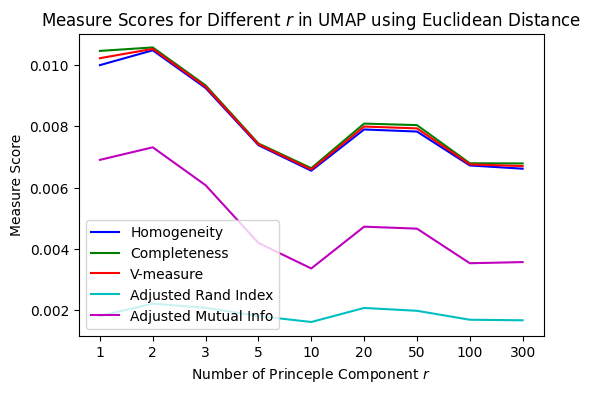

[1 1 1 1 1]
Best r for UMAP using Euclidean Distance: 2


2

In [ ]:
# Search for best r for UMAP with euclidean distance
_ = search_best_r_umap(r_list = r_list,
            data = X_tfidf_full,
            n_clusters = 20,
            true_label = dataset_full.target,
            title = 'UMAP using Euclidean Distance',
            metric = 'euclidean')

Homogeneity:	0.010474
Completeness:	0.010567
V-measure:	0.010520
Adjusted Rand Index:	0.002218
Adjusted Mutual Info:	0.007312


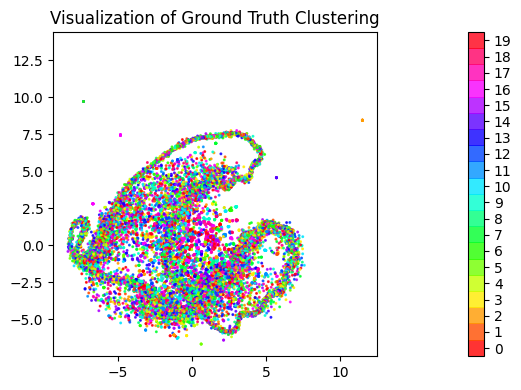

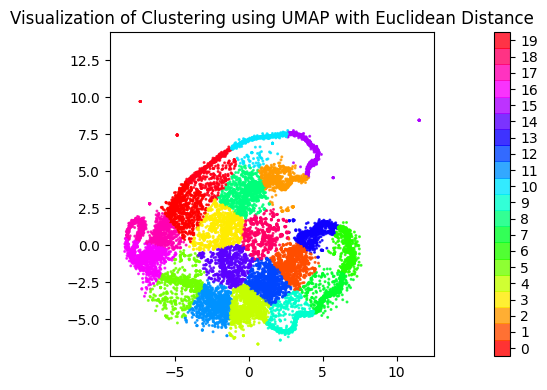

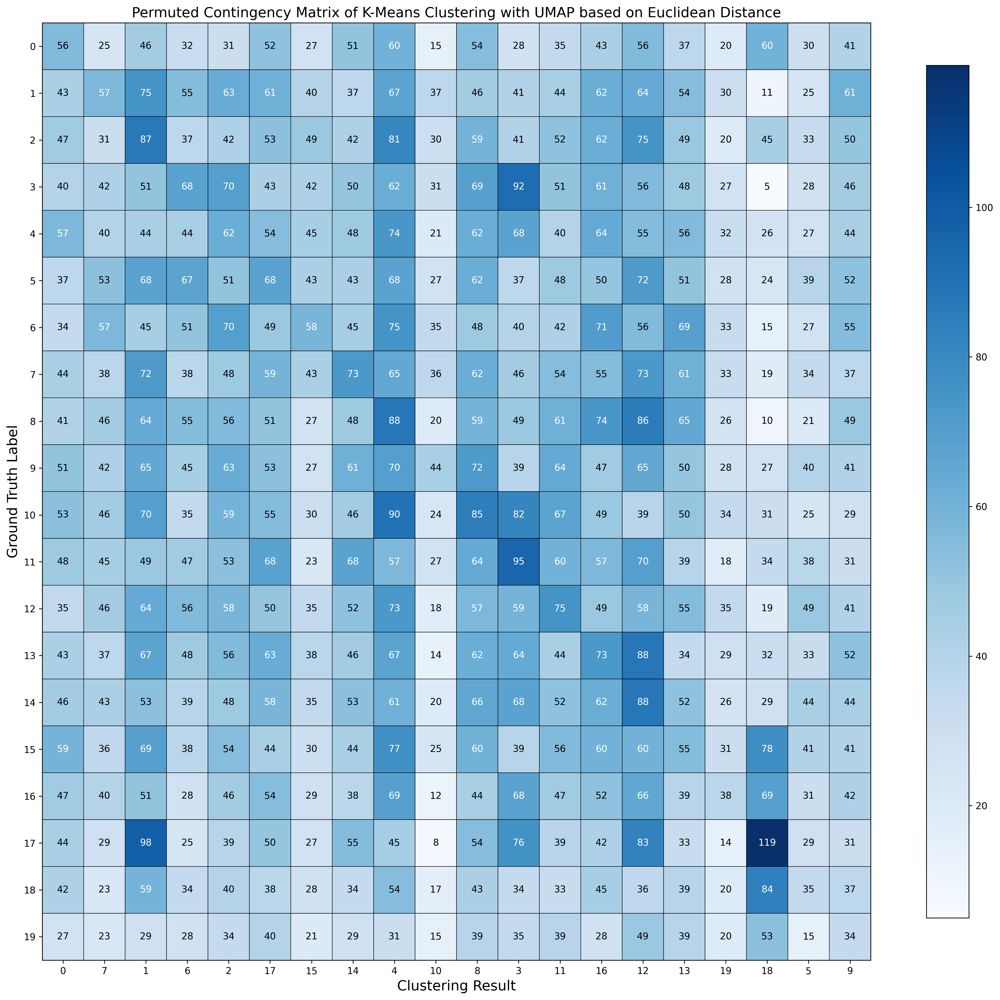

In [ ]:
# Best r for euclidean distance: r=2

best_full_UMAP_euclidean = UMAP(n_components=2, random_state=42, metric='euclidean')
X_reduced_full_UMAP_euclidean = best_full_UMAP_euclidean.fit_transform(X_tfidf_full)

km_full_UMAP_euclidean = KMeans(n_clusters=20, random_state=0, max_iter=1000, n_init=30)
km_full_UMAP_euclidean = measure_model(km_full_UMAP_euclidean, 
                    data = X_reduced_full_UMAP_euclidean,
                    title_visual = 'UMAP with Euclidean Distance', 
                    title_contingency = 'K-Means Clustering with UMAP based on Euclidean Distance')


Homogeneity:	0.257335
Completeness:	0.277639
V-measure:	0.267102
Adjusted Rand Index:	0.137044
Adjusted Mutual Info:	0.264619
r=1 is done.

Homogeneity:	0.448010
Completeness:	0.464165
V-measure:	0.455944
Adjusted Rand Index:	0.294088
Adjusted Mutual Info:	0.454143
r=2 is done.

Homogeneity:	0.482464
Completeness:	0.510472
V-measure:	0.496073
Adjusted Rand Index:	0.316426
Adjusted Mutual Info:	0.494375
r=3 is done.

Homogeneity:	0.502159
Completeness:	0.521886
V-measure:	0.511832
Adjusted Rand Index:	0.343456
Adjusted Mutual Info:	0.510217
r=5 is done.

Homogeneity:	0.493971
Completeness:	0.527065
V-measure:	0.509982
Adjusted Rand Index:	0.321614
Adjusted Mutual Info:	0.508332
r=10 is done.

Homogeneity:	0.483938
Completeness:	0.520723
V-measure:	0.501657
Adjusted Rand Index:	0.309380
Adjusted Mutual Info:	0.499967
r=20 is done.

Homogeneity:	0.496602
Completeness:	0.534889
V-measure:	0.515035
Adjusted Rand Index:	0.331305
Adjusted Mutual Info:	0.513393
r=50 is done.

Homogeneity:	0.50

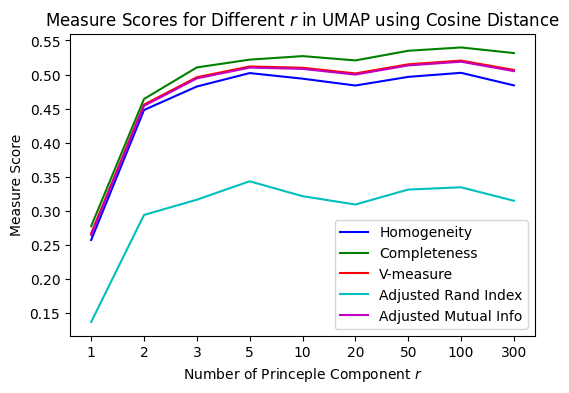

[7 7 7 3 7]
Best r for UMAP using Cosine Distance: 100


100

In [ ]:
# search for best r for UMAP with cosine distance
_ = search_best_r_umap(r_list = r_list,
            data = X_tfidf_full,
            n_clusters = 20,
            true_label = dataset_full.target,
            title = 'UMAP using Cosine Distance',
            metric = 'cosine')

Homogeneity:	0.502545
Completeness:	0.539768
V-measure:	0.520492
Adjusted Rand Index:	0.334623
Adjusted Mutual Info:	0.518871


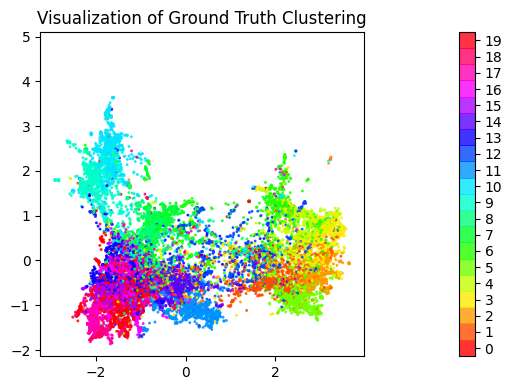

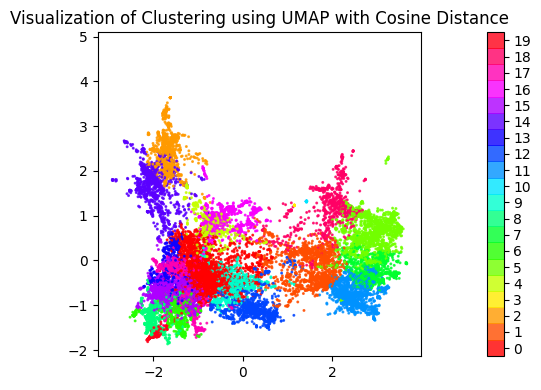

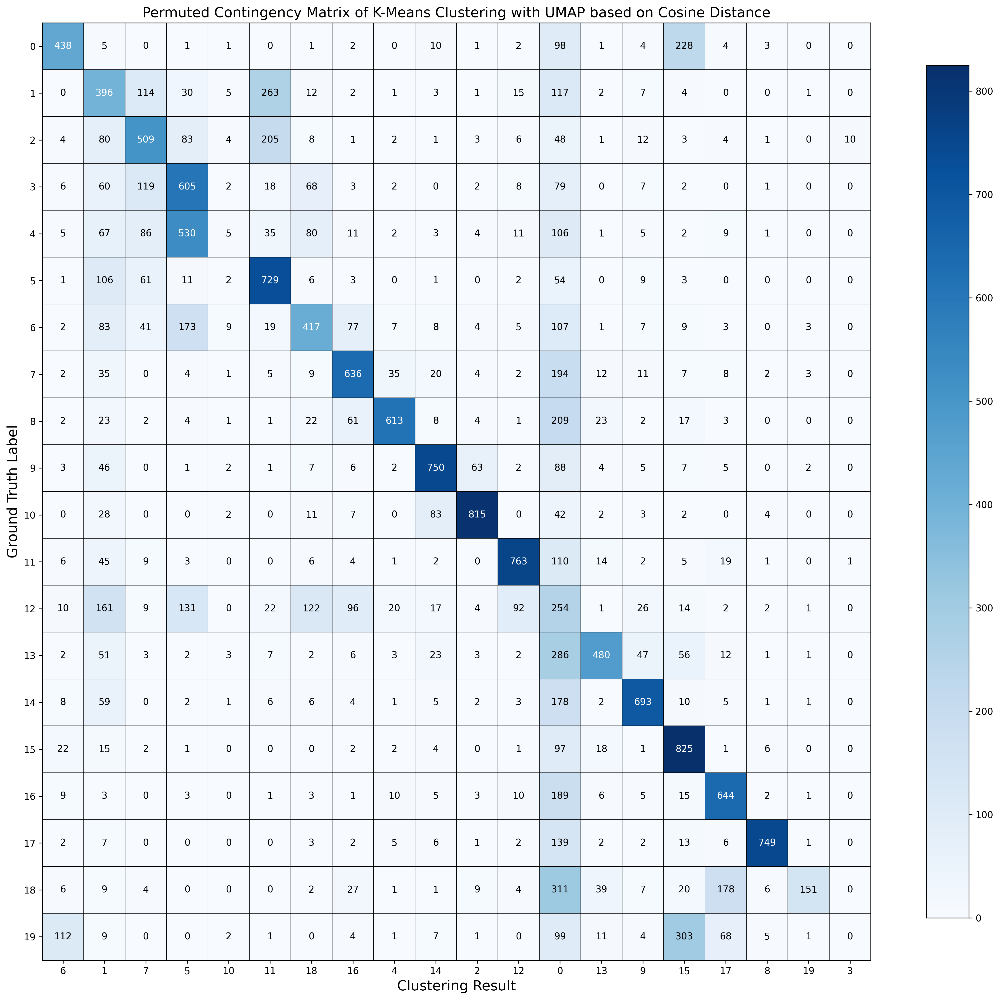

In [ ]:
# Best r for cosine distance: r=100

best_full_UMAP_cosine = UMAP(n_components=100, random_state=42, metric='cosine')
X_reduced_full_UMAP_cosine = best_full_UMAP_cosine.fit_transform(X_tfidf_full)

km_full_UMAP_cosine = KMeans(n_clusters=20, random_state=0, max_iter=1000, n_init=30)
km_full_UMAP_cosine = measure_model(km_full_UMAP_cosine,
                   data = X_reduced_full_UMAP_cosine,
                   title_visual = 'UMAP with Cosine Distance',
                   title_contingency = 'K-Means Clustering with UMAP based on Cosine Distance')


## More Clustering Algorithm

### Question 13

In [103]:
from sklearn.cluster import AgglomerativeClustering

Homogeneity:	0.477848
Completeness:	0.518667
V-measure:	0.497421
Adjusted Rand Index:	0.311786
Adjusted Mutual Info:	0.495703


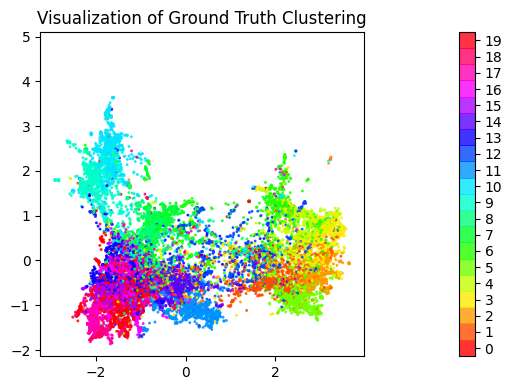

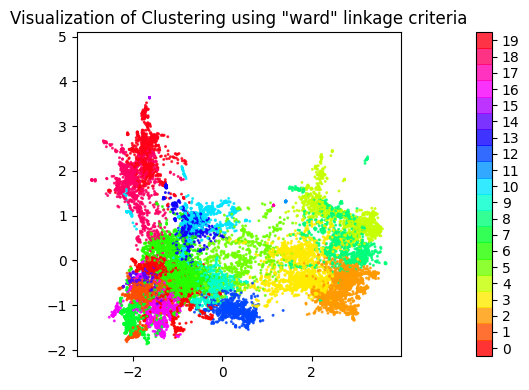

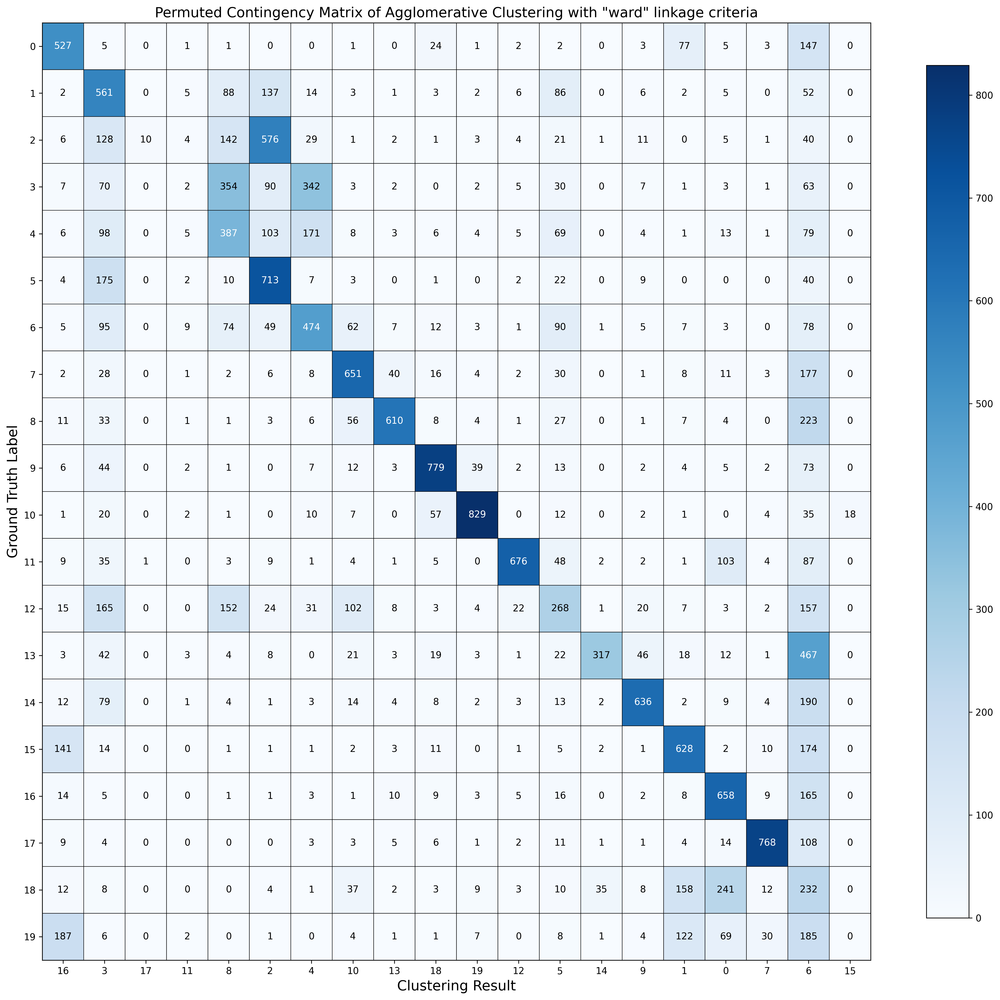

In [107]:
# linkage = 'ward'
AC_ward = AgglomerativeClustering(n_clusters=20, linkage='ward')
AC_ward = measure_model(AC_ward,
             data = X_reduced_full_UMAP_cosine,
             title_visual = '"ward" linkage criteria',
             title_contingency = 'Agglomerative Clustering with "ward" linkage criteria')


Homogeneity:	0.013459
Completeness:	0.268890
V-measure:	0.025635
Adjusted Rand Index:	0.000036
Adjusted Mutual Info:	0.019631


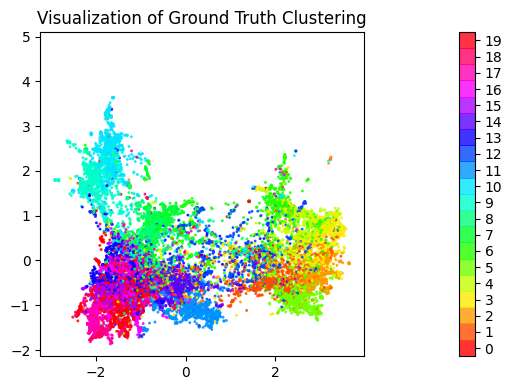

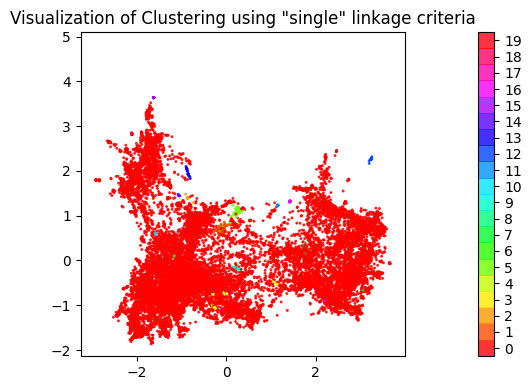

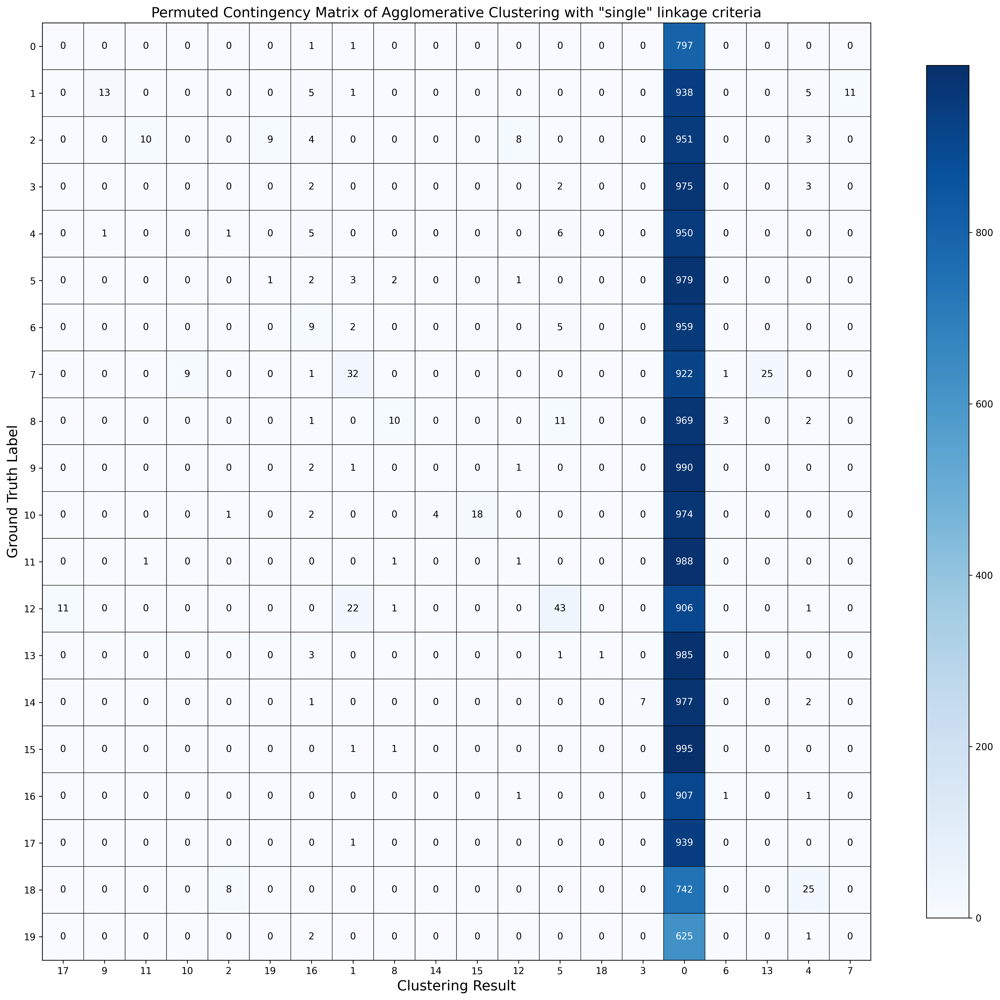

In [108]:
# linkage = 'single'
AC_single = AgglomerativeClustering(n_clusters=20, linkage='single')
AC_single = measure_model(AC_single,
              data = X_reduced_full_UMAP_cosine,
              title_visual = '"single" linkage criteria',
              title_contingency = 'Agglomerative Clustering with "single" linkage criteria')


### Question 14

#### DBSCAN

In [27]:
from sklearn.cluster import DBSCAN

In [39]:
def search_best_eps_dbscan(eps_list, min_samples = 5, data = X_reduced_full_UMAP_cosine, true_label = dataset_full.target, title = ''):
  metrics_all = []
  for eps in eps_list:
    cluster_model = DBSCAN(eps=eps, min_samples=min_samples)
    cluster_model.fit(data)
    metrics_all.append(report_metrics(true_label, cluster_model.labels_, True, False))
    print('eps=%.2f is done.' % eps)

  print(np.array(metrics_all))
  plot_measure_scores(metrics_all, 'Different eps in DBSCAN '+title, xticklabels=list(str(eps)[:4] for eps in eps_list), xlabel='Value of eps')
  
  print(np.argmax(metrics_all, axis=0))
  eps_best = eps_list[int(np.bincount(np.argmax(metrics_all, axis=0)).argmax())]
  print('Best eps for ' + title + ': ' + str(eps_best))
  print('Best measures: ' + str(metrics_all[int(np.bincount(np.argmax(metrics_all, axis=0)).argmax())]))
  return metrics_all

In [186]:
def search_best_minsamples_dbscan(min_samples_list, eps = 0.5, data = X_reduced_full_UMAP_cosine, true_label = dataset_full.target, title = ''):
  metrics_all = []
  for min_samples in min_samples_list:
    cluster_model = DBSCAN(eps=eps, min_samples=int(min_samples))
    cluster_model.fit(data)
    metrics_all.append(report_metrics(true_label, cluster_model.labels_, True, False))
    print('min_samples=%d is done.' % min_samples)

  print(np.array(metrics_all))
  plot_measure_scores(metrics_all, 'Different min_samples in DBSCAN '+title, xticklabels=min_samples_list, xlabel='Value of min_samples')
  
  print(np.argmax(metrics_all, axis=0))
  min_samples_best = min_samples_list[int(np.bincount(np.argmax(metrics_all, axis=0)).argmax())]
  print('Best min_samples for ' + title + ': ' + str(min_samples_best))
  print('Best measures: ' + str(metrics_all[int(np.bincount(np.argmax(metrics_all, axis=0)).argmax())]))
  return metrics_all

eps=0.02 is done.
eps=0.04 is done.
eps=0.06 is done.
eps=0.08 is done.
eps=0.10 is done.
eps=0.12 is done.
eps=0.14 is done.
eps=0.16 is done.
eps=0.18 is done.
eps=0.20 is done.
eps=0.22 is done.
eps=0.24 is done.
eps=0.26 is done.
eps=0.28 is done.
eps=0.30 is done.
eps=0.32 is done.
eps=0.34 is done.
eps=0.36 is done.
eps=0.38 is done.
eps=0.40 is done.
eps=0.42 is done.
eps=0.44 is done.
eps=0.46 is done.
eps=0.48 is done.
eps=0.50 is done.
[[ 2.81626346e-02  3.16835711e-01  5.17273690e-02 -8.61861753e-06
   3.22201041e-02]
 [ 1.12302616e-01  3.22322729e-01  1.66569603e-01  4.33666275e-04
   1.11473909e-01]
 [ 2.08130650e-01  3.27055402e-01  2.54379774e-01  1.34154162e-03
   1.84184587e-01]
 [ 2.99001880e-01  3.32149423e-01  3.14705211e-01  2.15060881e-03
   2.42529636e-01]
 [ 3.81098557e-01  3.37807767e-01  3.58149729e-01  4.05906401e-03
   2.89065248e-01]
 [ 4.48951346e-01  3.46223370e-01  3.90951686e-01  8.54920850e-03
   3.31155638e-01]
 [ 4.97944789e-01  3.56528088e-01  4.155

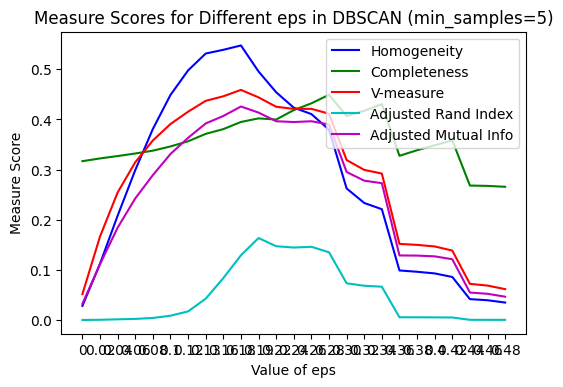

[ 9 14  9 10  9]
Best eps for (min_samples=5): 0.19999999999999998


In [ ]:
# Search for best eps in DBSCAN using min_samples=5
eps_list = np.arange(0.02, 0.52, 0.02)
metrics_eps = search_best_eps_dbscan(eps_list = eps_list,
                   min_samples = 5,
                   data = X_reduced_full_UMAP_cosine,
                   true_label = dataset_full.target,
                   title = '(min_samples=5)')

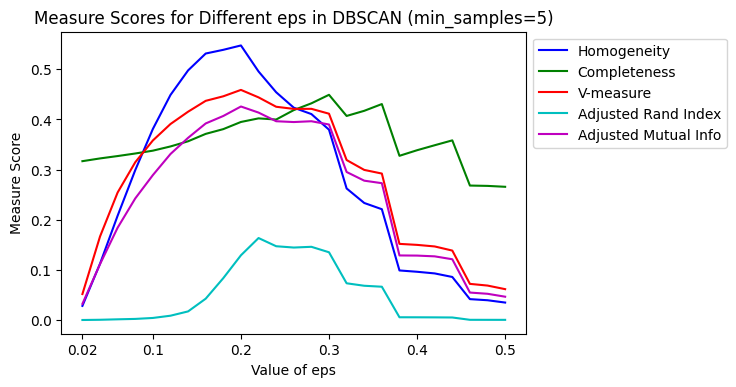

In [ ]:
# Re-plot metrics_eps
fig = plt.figure(figsize=(6,4), dpi=100)
ax = fig.add_subplot(1,1,1)

color_list = ['b', 'g', 'r', 'c', 'm']
for i in range(5):
  ax.plot(np.arange(np.matrix(metrics_eps).shape[0]), np.array(metrics_eps)[:,i], color = color_list[i], label = measurement_list[i])

eps_list = np.arange(0.02, 0.52, 0.02)
ax.set_xticks([0, 4, 9, 14, 19, 24])
ax.set_xticklabels([0.02, 0.1, 0.2, 0.3, 0.4, 0.5])
ax.set_xlabel('Value of eps')
ax.set_ylabel('Measure Score')
ax.set_title('Measure Scores for Different eps in DBSCAN (min_samples=5)')
ax.legend(bbox_to_anchor=(1, 1))

plt.show()

eps=0.20 is done.
eps=0.25 is done.
eps=0.30 is done.
eps=0.35 is done.
eps=0.40 is done.
eps=0.45 is done.
eps=0.50 is done.
eps=0.55 is done.
eps=0.60 is done.
eps=0.65 is done.
eps=0.70 is done.
eps=0.75 is done.
eps=0.80 is done.
eps=0.85 is done.
eps=0.90 is done.
eps=0.95 is done.
[[-5.10510162e-17  1.00000000e+00 -1.02102032e-16  0.00000000e+00
  -1.02102032e-16]
 [ 4.65079478e-02  4.72230882e-01  8.46764806e-02  1.90556309e-03
   8.32398292e-02]
 [ 1.32792020e-01  4.38301017e-01  2.03829757e-01  7.20629537e-03
   2.00431695e-01]
 [ 2.52791213e-01  4.07277878e-01  3.11956037e-01  2.27305067e-02
   3.08147638e-01]
 [ 3.36614754e-01  4.28956058e-01  3.77216414e-01  6.23596947e-02
   3.74092394e-01]
 [ 3.56557088e-01  4.49586525e-01  3.97703981e-01  1.11774423e-01
   3.95284407e-01]
 [ 3.17976125e-01  4.56893293e-01  3.74982301e-01  1.32412923e-01
   3.73219011e-01]
 [ 2.85323436e-01  4.77303936e-01  3.57149518e-01  1.19046670e-01
   3.55490453e-01]
 [ 2.54573866e-01  4.93828723e-0

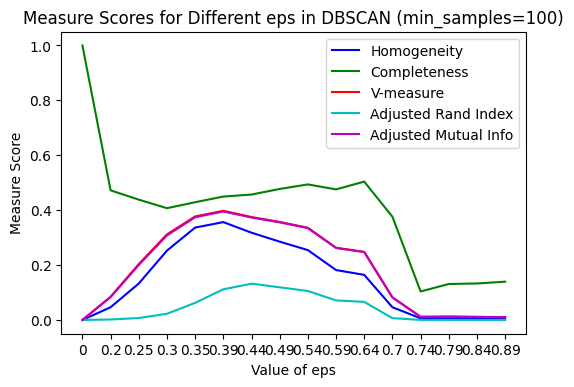

[5 0 5 6 5]
Best eps for (min_samples=100): 0.44999999999999996


In [ ]:
# Search for best eps in DBSCAN using min_samples=100
eps_list = np.arange(0.2, 1.0, 0.05)
metrics_eps_100 = search_best_eps_dbscan(eps_list = eps_list,
                   min_samples = 100,
                   data = X_reduced_full_UMAP_cosine,
                   true_label = dataset_full.target,
                   title = '(min_samples=100)')

min_samples=5 is done.
min_samples=10 is done.
min_samples=25 is done.
min_samples=40 is done.
min_samples=50 is done.
min_samples=60 is done.
min_samples=75 is done.
min_samples=100 is done.
min_samples=125 is done.
min_samples=150 is done.
min_samples=200 is done.
[[ 5.47704200e-01  3.95062071e-01  4.59026086e-01  1.29089312e-01
   4.25907313e-01]
 [ 4.73613063e-01  3.90120392e-01  4.27831324e-01  5.23692962e-02
   4.04767636e-01]
 [ 2.65447020e-01  3.73365596e-01  3.10290631e-01  8.74994668e-03
   2.96462230e-01]
 [ 1.39716066e-01  3.69829886e-01  2.02812628e-01  3.16981567e-03
   1.93805993e-01]
 [ 8.93164280e-02  3.94903166e-01  1.45683242e-01  2.41330261e-03
   1.40383409e-01]
 [ 6.24957863e-02  4.17417993e-01  1.08714802e-01  1.72270362e-03
   1.05102259e-01]
 [ 3.32768558e-02  4.25937294e-01  6.17309110e-02  9.47864519e-04
   5.95608328e-02]
 [-5.10510162e-17  1.00000000e+00 -1.02102032e-16  0.00000000e+00
  -1.02102032e-16]
 [-5.10510162e-17  1.00000000e+00 -1.02102032e-16  0.

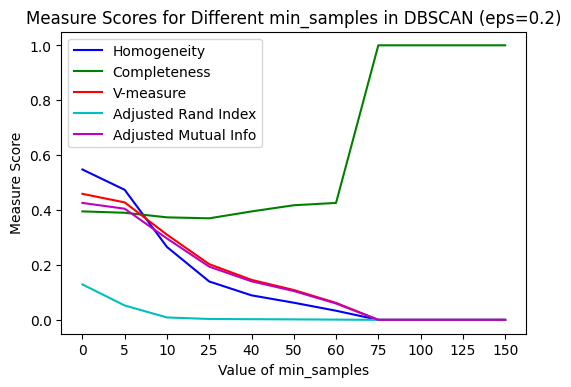

[0 7 0 0 0]
Best min_samples for (eps=0.2): 5
Best measures: [0.5477042003556208, 0.39506207068906113, 0.45902608560193786, 0.1290893120052847, 0.4259073132867164]


In [ ]:
# Search for best min_samples in DBSCAN using eps=0.2
min_samples_list = [5, 10, 25, 40, 50, 60, 75, 100, 125, 150, 200]
metrics_minsample = search_best_minsamples_dbscan(min_samples_list = min_samples_list, 
                          eps = 0.2, 
                          data = X_reduced_full_UMAP_cosine,
                          true_label = dataset_full.target,
                          title = '(eps=0.2)')

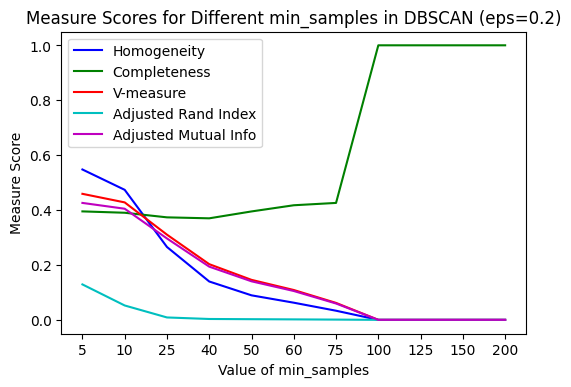

In [ ]:
# Re-plot metrics_minsamples
fig = plt.figure(figsize=(6,4), dpi=100)
ax = fig.add_subplot(1,1,1)

color_list = ['b', 'g', 'r', 'c', 'm']
for i in range(5):
  ax.plot(np.arange(np.matrix(metrics_minsample).shape[0]), np.array(metrics_minsample)[:,i], color = color_list[i], label = measurement_list[i])

min_samples_list = [5, 10, 25, 40, 50, 60, 75, 100, 125, 150, 200]
ax.set_xticks(np.arange(np.matrix(metrics_minsample).shape[0]))
ax.set_xticklabels(min_samples_list)
ax.set_xlabel('Value of min_samples')
ax.set_ylabel('Measure Score')
ax.set_title('Measure Scores for Different min_samples in DBSCAN (eps=0.2)')
# ax.legend(bbox_to_anchor=(1, 1))
ax.legend()

plt.show()

min_samples=5 is done.
min_samples=10 is done.
min_samples=25 is done.
min_samples=40 is done.
min_samples=50 is done.
min_samples=60 is done.
min_samples=75 is done.
min_samples=100 is done.
min_samples=125 is done.
min_samples=150 is done.
min_samples=200 is done.
[[3.47851578e-02 2.65724276e-01 6.15172758e-02 2.85124375e-04
  4.64641067e-02]
 [3.11059362e-02 2.38475640e-01 5.50334941e-02 3.20251198e-04
  4.42111474e-02]
 [1.90195042e-01 4.55359319e-01 2.68318488e-01 6.70447772e-02
  2.64422596e-01]
 [2.32400101e-01 4.70803786e-01 3.11189541e-01 8.51602992e-02
  3.08154823e-01]
 [2.68312864e-01 4.83828608e-01 3.45194207e-01 1.09751703e-01
  3.43111523e-01]
 [2.62213540e-01 4.66460132e-01 3.35711766e-01 1.05385512e-01
  3.33780116e-01]
 [3.06802992e-01 4.69344364e-01 3.71053909e-01 1.27812886e-01
  3.69357712e-01]
 [3.17976125e-01 4.56893293e-01 3.74982301e-01 1.32412923e-01
  3.73219011e-01]
 [3.71552135e-01 4.63511875e-01 4.12468564e-01 1.45062037e-01
  4.10232181e-01]
 [3.24530339e

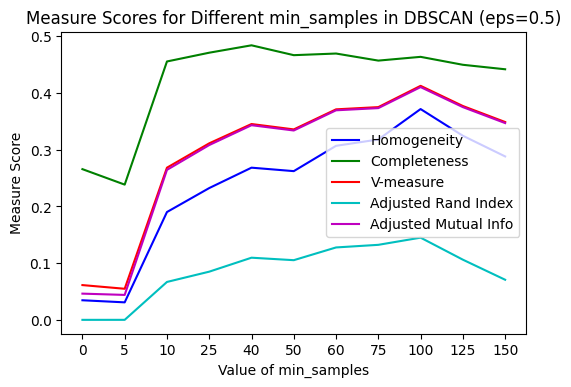

[8 4 8 8 8]
Best min_samples for (eps=0.5): 125
Best measures: [0.37155213494887607, 0.4635118746922086, 0.41246856439200796, 0.1450620373627165, 0.410232181268002]


In [ ]:
# Search for best min_samples in DBSCAN using eps=0.5
min_samples_list = [5, 10, 25, 40, 50, 60, 75, 100, 125, 150, 200]
metrics_minsample_2 = search_best_minsamples_dbscan(min_samples_list = min_samples_list, 
                          eps = 0.5, 
                          data = X_reduced_full_UMAP_cosine,
                          true_label = dataset_full.target,
                          title = '(eps=0.5)')

Homogeneity:	0.547704
Completeness:	0.395062
V-measure:	0.459026
Adjusted Rand Index:	0.129089
Adjusted Mutual Info:	0.425907


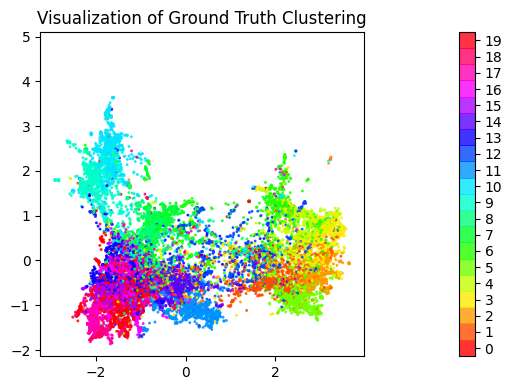

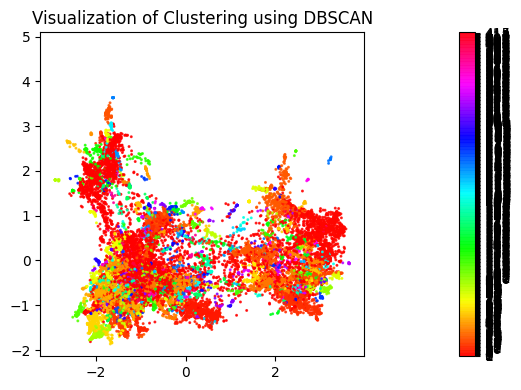

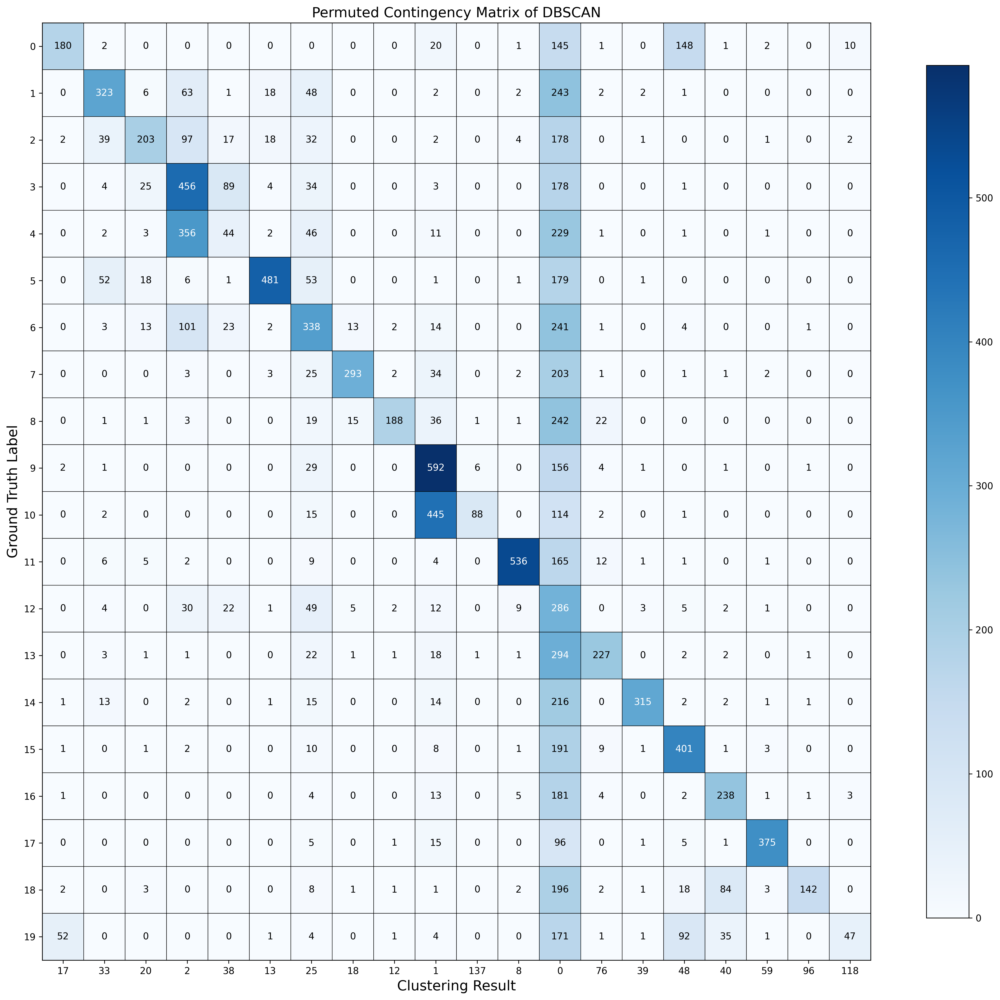

In [111]:
# Best combination for DBSCAN: eps=0.2, min_samples=5

dbscan_model = DBSCAN(eps=0.2, min_samples=5)
dbscan_model = measure_model(dbscan_model, X_reduced_full_UMAP_cosine, 'DBSCAN', 'DBSCAN')

In [112]:
# Question 15
print(dbscan_model.labels_)
print(len(np.unique(dbscan_model.labels_)))

[  0   1   2 ...  79 184  -1]
416


#### HDBSCAN

In [19]:
!pip install hdbscan

     |████████████████████████████████| 4.7MB 5.4MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for hdbscan: filename=hdbscan-0.8.26-cp36-cp36m-linux_x86_64.whl size=2301784 sha256=7bcc548b484692884fcb0fc01374d21b7db5d798d1856e6b6654a301d4e5bb8c
  Stored in directory: /root/.cache/pip/wheels/82/38/41/372f034d8abd271ef7787a681e0a47fc05d472683a7eb088ed
Successfully built hdbscan


In [20]:
from hdbscan import HDBSCAN

In [21]:
def search_best_eps_hdbscan(eps_list, min_samples = 5, data = X_reduced_full_UMAP_cosine, true_label = dataset_full.target, title = ''):
  metrics_all = []
  for eps in eps_list:
    cluster_model = HDBSCAN(cluster_selection_epsilon=float(eps), min_samples=min_samples, min_cluster_size=100)
    cluster_model.fit(data)
    metrics_all.append(report_metrics(true_label, cluster_model.labels_, True, False))
    print('eps=%.2f is done.' % eps)

  print(np.array(metrics_all))
  plot_measure_scores(metrics_all, 'Different eps in HDBSCAN '+title, xticklabels=list(str(eps)[:4] for eps in eps_list), xlabel='Value of eps')
  
  print(np.argmax(metrics_all, axis=0))
  eps_best = eps_list[int(np.bincount(np.argmax(metrics_all, axis=0)).argmax())]
  print('Best eps for ' + title + ': ' + str(eps_best))
  print('Best measures: ' + str(metrics_all[int(np.bincount(np.argmax(metrics_all, axis=0)).argmax())]))
  return metrics_all

In [187]:
def search_best_minsamples_hdbscan(min_samples_list, eps = 0.5, data = X_reduced_full_UMAP_cosine, true_label = dataset_full.target, title = ''):
  metrics_all = []
  for min_samples in min_samples_list:
    cluster_model = HDBSCAN(cluster_selection_epsilon=eps, min_samples=int(min_samples), min_cluster_size=100)
    cluster_model.fit(data)
    metrics_all.append(report_metrics(true_label, cluster_model.labels_, True, False))
    print('min_samples=%d is done.' % min_samples)

  print(np.array(metrics_all))
  plot_measure_scores(metrics_all, 'Different min_samples in HDBSCAN '+title, xticklabels=min_samples_list, xlabel='Value of min_samples')
  
  print(np.argmax(metrics_all, axis=0))
  min_samples_best = min_samples_list[int(np.bincount(np.argmax(metrics_all, axis=0)).argmax())]
  print('Best min_samples for ' + title + ': ' + str(min_samples_best))
  print('Best measures: ' + str(metrics_all[int(np.bincount(np.argmax(metrics_all, axis=0)).argmax())]))
  return metrics_all

eps=0.02 is done.
eps=0.04 is done.
eps=0.06 is done.
eps=0.08 is done.
eps=0.10 is done.
eps=0.12 is done.
eps=0.14 is done.
eps=0.16 is done.
eps=0.18 is done.
eps=0.20 is done.
eps=0.22 is done.
eps=0.24 is done.
eps=0.26 is done.
eps=0.28 is done.
eps=0.30 is done.
eps=0.32 is done.
eps=0.34 is done.
eps=0.36 is done.
eps=0.38 is done.
eps=0.40 is done.
eps=0.42 is done.
eps=0.44 is done.
eps=0.46 is done.
eps=0.48 is done.
eps=0.50 is done.
[[0.38034535 0.45862655 0.41583389 0.09739405 0.41297417]
 [0.38034535 0.45862655 0.41583389 0.09739405 0.41297417]
 [0.38034535 0.45862655 0.41583389 0.09739405 0.41297417]
 [0.38034535 0.45862655 0.41583389 0.09739405 0.41297417]
 [0.38034535 0.45862655 0.41583389 0.09739405 0.41297417]
 [0.38034535 0.45862655 0.41583389 0.09739405 0.41297417]
 [0.38034535 0.45862655 0.41583389 0.09739405 0.41297417]
 [0.38034535 0.45862655 0.41583389 0.09739405 0.41297417]
 [0.38034535 0.45862655 0.41583389 0.09739405 0.41297417]
 [0.38181887 0.46188046 0.41

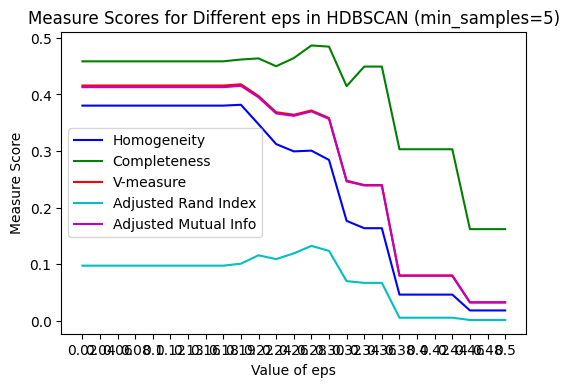

[ 9 13  9 13  9]
Best eps for (min_samples=5): 0.19999999999999998
Best measures: [0.38181886538409304, 0.4618804571991836, 0.4180509984787181, 0.10094015127281533, 0.4153091634399031]


In [24]:
# Search for best eps in HDBSCAN using min_samples=5
eps_list = np.arange(0.02, 0.52, 0.02)
metrics_eps_hdbscan = search_best_eps_hdbscan(eps_list = eps_list,
                   min_samples = 5,
                   data = X_reduced_full_UMAP_cosine,
                   true_label = dataset_full.target,
                   title = '(min_samples=5)')

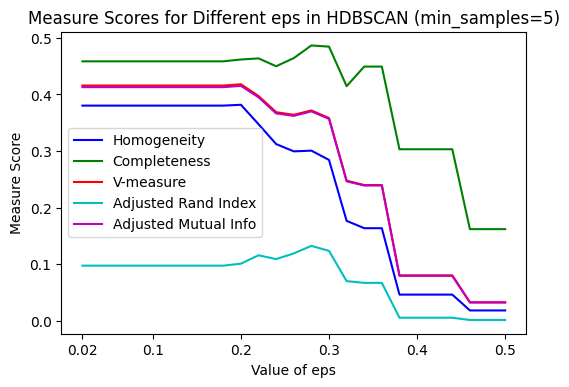

In [38]:
# Re-plot metrics_eps_hdbscan
fig = plt.figure(figsize=(6,4), dpi=100)
ax = fig.add_subplot(1,1,1)

color_list = ['b', 'g', 'r', 'c', 'm']
for i in range(5):
  ax.plot(np.arange(np.matrix(metrics_eps_hdbscan).shape[0]), np.array(metrics_eps_hdbscan)[:,i], color = color_list[i], label = measurement_list[i])

eps_list = np.arange(0.02, 0.52, 0.02)
ax.set_xticks([0, 4, 9, 14, 19, 24])
ax.set_xticklabels([0.02, 0.1, 0.2, 0.3, 0.4, 0.5])
ax.set_xlabel('Value of eps')
ax.set_ylabel('Measure Score')
ax.set_title('Measure Scores for Different eps in HDBSCAN (min_samples=5)')
ax.legend()

plt.show()

eps=0.02 is done.
eps=0.04 is done.
eps=0.06 is done.
eps=0.08 is done.
eps=0.10 is done.
eps=0.12 is done.
eps=0.14 is done.
eps=0.16 is done.
eps=0.18 is done.
eps=0.20 is done.
eps=0.22 is done.
eps=0.24 is done.
eps=0.26 is done.
eps=0.28 is done.
eps=0.30 is done.
eps=0.32 is done.
eps=0.34 is done.
eps=0.36 is done.
eps=0.38 is done.
eps=0.40 is done.
eps=0.42 is done.
eps=0.44 is done.
eps=0.46 is done.
eps=0.48 is done.
eps=0.50 is done.
[[0.26941417 0.45332099 0.33796917 0.08330406 0.33626476]
 [0.26941417 0.45332099 0.33796917 0.08330406 0.33626476]
 [0.26941417 0.45332099 0.33796917 0.08330406 0.33626476]
 [0.26941417 0.45332099 0.33796917 0.08330406 0.33626476]
 [0.26941417 0.45332099 0.33796917 0.08330406 0.33626476]
 [0.26941417 0.45332099 0.33796917 0.08330406 0.33626476]
 [0.26941417 0.45332099 0.33796917 0.08330406 0.33626476]
 [0.26941417 0.45332099 0.33796917 0.08330406 0.33626476]
 [0.26941417 0.45332099 0.33796917 0.08330406 0.33626476]
 [0.26941417 0.45332099 0.33

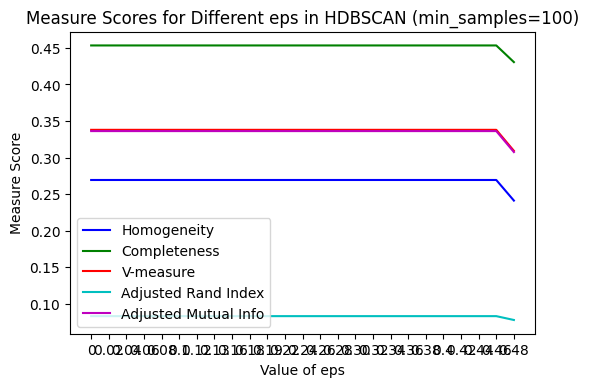

[0 0 0 0 0]
Best eps for (min_samples=100): 0.02
Best measures: [0.2694141736028684, 0.45332099292522143, 0.3379691658632845, 0.08330406203881681, 0.336264759914447]


In [ ]:
# Search for best eps in HDBSCAN using min_samples=100
eps_list = np.arange(0.02, 0.52, 0.02)
metrics_eps_hdbscan = search_best_eps_hdbscan(eps_list = eps_list,
                   min_samples = 100,
                   data = X_reduced_full_UMAP_cosine,
                   true_label = dataset_full.target,
                   title = '(min_samples=100)')

min_samples=5 is done.
min_samples=10 is done.
min_samples=25 is done.
min_samples=40 is done.
min_samples=50 is done.
min_samples=60 is done.
min_samples=75 is done.
min_samples=100 is done.
min_samples=125 is done.
min_samples=150 is done.
min_samples=200 is done.
[[0.38181887 0.46188046 0.418051   0.10094015 0.41530916]
 [0.37317289 0.4648486  0.41399629 0.07845428 0.41109045]
 [0.28034291 0.47289269 0.35200703 0.11480694 0.35061953]
 [0.26586936 0.45596548 0.3358864  0.10085428 0.3344552 ]
 [0.29985725 0.48636388 0.37098911 0.07880916 0.36858119]
 [0.2917501  0.48207918 0.36350821 0.07546349 0.36105171]
 [0.26975256 0.46380003 0.3411105  0.07776329 0.33910915]
 [0.26941417 0.45332099 0.33796917 0.08330406 0.33626476]
 [0.26657586 0.45391448 0.3358897  0.08258778 0.33417161]
 [0.25511103 0.44854375 0.32524033 0.07896468 0.32362232]
 [0.24323089 0.44077836 0.31347796 0.07410742 0.31196674]]


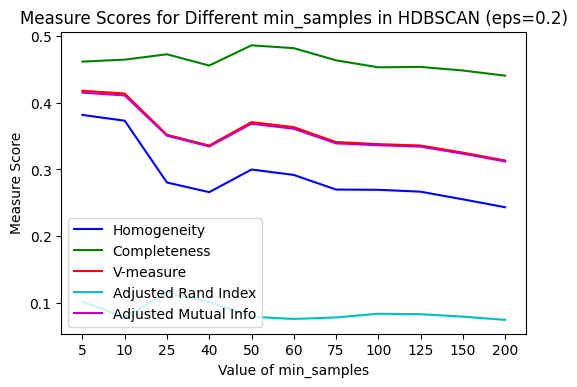

[0 4 0 2 0]
Best min_samples for (eps=0.2): 5
Best measures: [0.38181886538409304, 0.4618804571991836, 0.4180509984787181, 0.10094015127281533, 0.4153091634399031]


In [25]:
# Search for best min_samples in HDBSCAN using eps=0.2
min_samples_list = [5, 10, 25, 40, 50, 60, 75, 100, 125, 150, 200]
metrics_minsample_hdbscan = search_best_minsamples_hdbscan(min_samples_list = min_samples_list, 
                          eps = 0.2, 
                          data = X_reduced_full_UMAP_cosine,
                          true_label = dataset_full.target,
                          title = '(eps=0.2)')

Homogeneity:	0.381819
Completeness:	0.461880
V-measure:	0.418051
Adjusted Rand Index:	0.100940
Adjusted Mutual Info:	0.415309


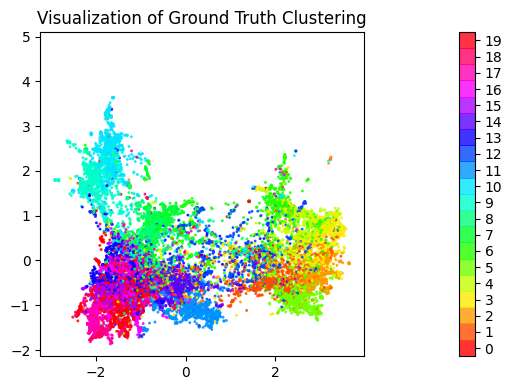

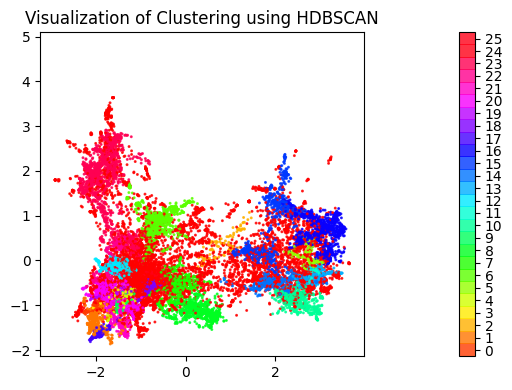

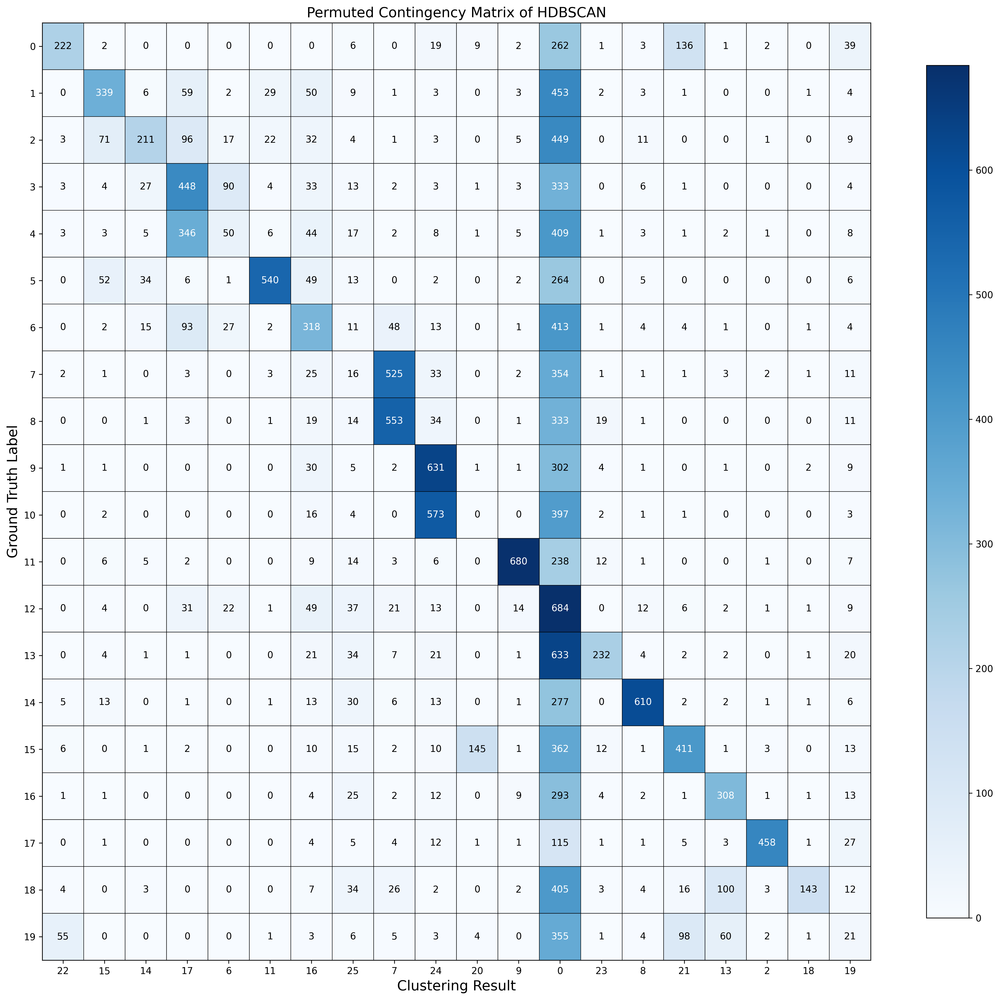

In [26]:
# Best combination for DBSCAN: eps=0.2, min_samples=5

hdbscan_model = HDBSCAN(cluster_selection_epsilon=0.2, min_samples=5, min_cluster_size=100)
hdbscan_model = measure_model(hdbscan_model, X_reduced_full_UMAP_cosine, 'HDBSCAN', 'HDBSCAN')

In [36]:
print(hdbscan_model.labels_)
print(len(np.unique(hdbscan_model.labels_)))

[23 16  0 ... -1 -1 -1]
26


# Part 2 - BBCNews Dataset

## Question 16

### Data Acquiring

In [41]:
import pandas as pd

In [46]:
data_csv = pd.read_csv('BBC News Train.csv')
print(pd.DataFrame(data_csv))

      ArticleId  ...       Category
0          1833  ...       business
1           154  ...       business
2          1101  ...       business
3          1976  ...           tech
4           917  ...       business
...         ...  ...            ...
1485        857  ...  entertainment
1486        325  ...  entertainment
1487       1590  ...       business
1488       1587  ...           tech
1489        538  ...           tech

[1490 rows x 3 columns]


In [118]:
bbc_label_names = list(data_csv.Category.unique())
print(bbc_label_names)

['business', 'tech', 'politics', 'sport', 'entertainment']


In [123]:
bbc_true_labels = list(map(lambda x: bbc_label_names.index(x), data_csv.Category))
print(bbc_true_labels[:20])

[0, 0, 0, 1, 0, 2, 3, 4, 0, 4, 2, 4, 0, 0, 3, 3, 4, 3, 3, 1]


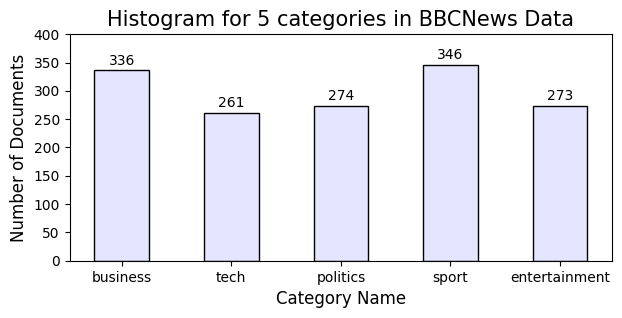

In [93]:
plt.figure(figsize=(7,3), dpi=100)
ax = plt.subplot(111)
hist = ax.hist(data_csv.Category, bins=range(6), rwidth=0.5, edgecolor='black', facecolor=np.array([0,0,1,0.1]))
plt.xticks([i+0.5 for i in range(5)])

for i in range(5):
  label_val = hist[0][i]
  plt.text(i+0.5, label_val+5, '%d' % label_val, ha='center', va='bottom', fontsize=10)

ax.set_xticklabels(bbc_label_list)
ax.set_ylim([0,400])
ax.set_xlabel("Category Name", size=12)
ax.set_ylabel("Number of Documents", size=12)
ax.set_title("Histogram for 5 categories in BBCNews Data", size=15)
plt.show()

In [94]:
# Check data is evenly distributed
print(hist[0])
print(np.mean(hist[0]))
print(np.std(hist[0]))

[336. 261. 274. 346. 273.]
298.0
35.5471517846367


In [100]:
# Transform to TF-IDF matrix (without lemmatization)
BBC_vectorizer = CountVectorizer(min_df=3, stop_words=None)
BBC_vec = BBC_vectorizer.fit_transform(data_csv.Text)

BBC_transformer = TfidfTransformer()
BBC_tfidf = BBC_transformer.fit_transform(BBC_vec)

print('TF-IDF matrix dimension of BBCNews Data:', BBC_tfidf.shape)

TF-IDF matrix dimension of BBCNews Data: (1490, 10557)


### Feature Extraction (Dimensionality Reduction)

#### SVD

r=1 is done.
r=2 is done.
r=3 is done.
r=5 is done.
r=10 is done.
r=20 is done.
r=50 is done.
r=100 is done.
r=300 is done.
[[0.04197124 0.04343144 0.04268886 0.02285145 0.03939939]
 [0.38114351 0.3982295  0.38949922 0.25858647 0.3873908 ]
 [0.44386313 0.45519947 0.44945983 0.32983495 0.44757685]
 [0.65856206 0.67997092 0.66909528 0.66410924 0.6679596 ]
 [0.67217757 0.69451363 0.68316308 0.67759837 0.68207531]
 [0.78421343 0.79429717 0.78922309 0.80318745 0.7885068 ]
 [0.62548531 0.69128078 0.65673923 0.54476175 0.6555203 ]
 [0.76681976 0.78596458 0.77627415 0.75636241 0.77550919]
 [0.66651032 0.71433263 0.68959337 0.64305104 0.68850761]]


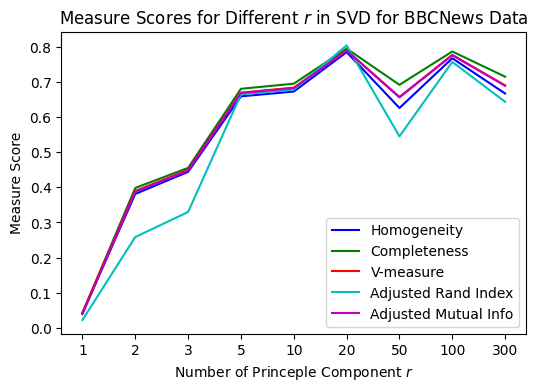

[5 5 5 5 5]
Best r for SVD for BBCNews Data: 20
Best measures: [0.7842134264348743, 0.7942971738206098, 0.7892230919305584, 0.8031874537478629, 0.788506796460893]


In [131]:
bbc_metric_svd = search_best_r('svd', r_list=r_list, data=BBC_tfidf, n_clusters=5, true_label=bbc_true_labels, title='SVD for BBCNews Data')

#### NMF

r=1 is done.
r=2 is done.
r=3 is done.
r=5 is done.
r=10 is done.
r=20 is done.
r=50 is done.
r=100 is done.
r=300 is done.
[[4.19712432e-02 4.34314416e-02 4.26888593e-02 2.28514489e-02
  3.93993865e-02]
 [3.64851175e-01 3.77872535e-01 3.71247710e-01 2.48390374e-01
  3.69086283e-01]
 [5.25209499e-01 5.69415556e-01 5.46419904e-01 4.40680599e-01
  5.44824422e-01]
 [6.39682004e-01 6.65694141e-01 6.52428901e-01 6.42957675e-01
  6.51231239e-01]
 [5.10865614e-01 6.02791321e-01 5.53034509e-01 4.22797001e-01
  5.51395285e-01]
 [2.35852623e-01 4.05447673e-01 2.98225021e-01 8.67926269e-02
  2.95200655e-01]
 [1.47766361e-01 3.99016858e-01 2.15665979e-01 3.19060903e-02
  2.11593451e-01]
 [3.44764002e-02 1.81473597e-01 5.79444912e-02 3.77068230e-04
  5.19238663e-02]
 [2.19682952e-02 1.84717728e-01 3.92666471e-02 8.70961328e-04
  3.26267393e-02]]


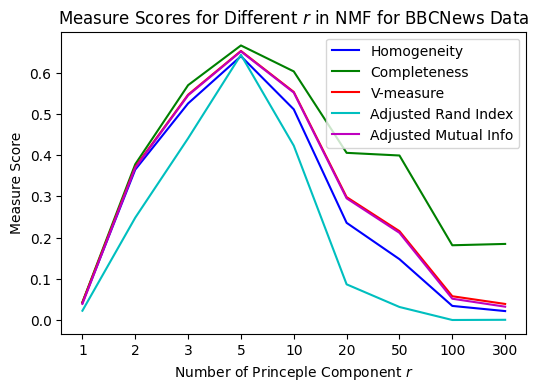

[3 3 3 3 3]
Best r for NMF for BBCNews Data: 5
Best measures: [0.6396820036394193, 0.6656941409490331, 0.6524289012919755, 0.6429576750359907, 0.6512312392174381]


In [132]:
bbc_metric_nmf = search_best_r('NMF', r_list=r_list, data=BBC_tfidf, n_clusters=5, true_label=bbc_true_labels, title='NMF for BBCNews Data')

r=1 is done.
r=2 is done.
r=3 is done.
r=5 is done.
r=10 is done.
r=20 is done.
r=50 is done.
r=100 is done.
r=300 is done.
[[0.03467281 0.03652774 0.03557611 0.02300937 0.03223089]
 [0.38504358 0.40494285 0.39474258 0.26086665 0.39264584]
 [0.47516831 0.52237678 0.49765549 0.37864561 0.49587683]
 [0.70497947 0.71068751 0.70782198 0.67090382 0.70683147]
 [0.71895809 0.73248669 0.72565934 0.7019563  0.72472412]
 [0.46375794 0.56202915 0.50818631 0.33677752 0.5063612 ]
 [0.4360748  0.62669995 0.51429159 0.32243569 0.51233686]
 [0.10491705 0.32688501 0.15884968 0.01125114 0.15436955]
 [0.13651204 0.40768872 0.20453635 0.0396886  0.20025677]]


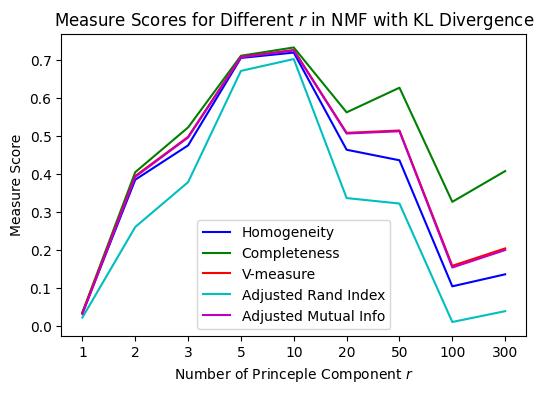

[4 4 4 4 4]
Best r for NMF with KL Divergence: 10
Best measures: [0.7189580890417986, 0.7324866864525638, 0.7256593392072047, 0.7019563001080159, 0.7247241156078706]


In [133]:
bbc_metric_nmf_kldivergence = search_best_r_KLDivergence(r_list=r_list, data=BBC_tfidf, n_clusters=5, true_label=bbc_true_labels, title='NMF with KL Divergence')

#### UMAP

r=1 is done.
r=2 is done.
r=3 is done.
r=5 is done.
r=10 is done.
r=20 is done.
r=50 is done.
r=100 is done.
r=300 is done.
[[0.58525593 0.58971175 0.58747539 0.51327087 0.58607721]
 [0.67803752 0.67831355 0.67817551 0.64390275 0.67708877]
 [0.77781652 0.77641084 0.77711305 0.81107017 0.77636126]
 [0.69030108 0.69181977 0.69105959 0.65658504 0.6900154 ]
 [0.79003555 0.78956427 0.78979984 0.82474058 0.78909041]
 [0.65593038 0.69183345 0.67340371 0.59799966 0.67227063]
 [0.79161905 0.79111413 0.79136651 0.82621327 0.79066238]
 [0.66060936 0.69589308 0.67779234 0.60229766 0.6766752 ]
 [0.65923607 0.69378492 0.6760694  0.60202019 0.67494685]]


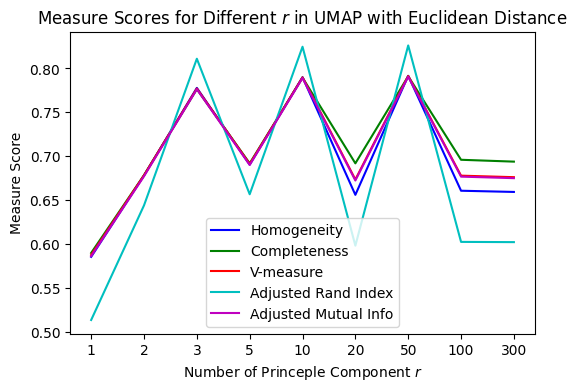

[6 6 6 6 6]
Best r for UMAP with Euclidean Distance: 50
Best measures: [0.7916190540638574, 0.7911141266535432, 0.7913665098171115, 0.826213267786634, 0.7906623782196964]


In [134]:
bbc_metric_umap_euclidean = search_best_r_umap(r_list = r_list,
                        data = BBC_tfidf,
                        n_clusters = 5,
                        true_label = bbc_true_labels,
                        title = 'UMAP with Euclidean Distance', 
                        metric = 'euclidean')

r=1 is done.
r=2 is done.
r=3 is done.
r=5 is done.
r=10 is done.
r=20 is done.
r=50 is done.
r=100 is done.
r=300 is done.
[[0.58804902 0.60877754 0.59823377 0.53574014 0.59685286]
 [0.66095184 0.66072752 0.66083966 0.62247763 0.65969483]
 [0.68649353 0.68761566 0.68705414 0.64818115 0.68599671]
 [0.69533023 0.69472636 0.69502816 0.66728693 0.69399901]
 [0.79060408 0.79034641 0.79047522 0.8244369  0.78976797]
 [0.79370424 0.79340421 0.7935542  0.82737286 0.79285736]
 [0.66171417 0.69744316 0.67910905 0.60275104 0.67799616]
 [0.79182914 0.79085905 0.7913438  0.82265521 0.7906398 ]
 [0.78175419 0.7813944  0.78157425 0.81518942 0.780837  ]]


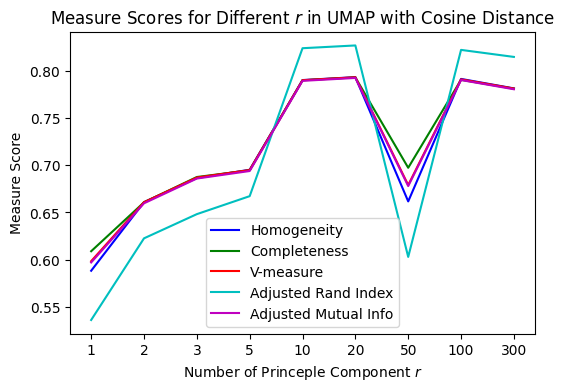

[5 5 5 5 5]
Best r for UMAP with Cosine Distance: 20
Best measures: [0.7937042425748744, 0.7934042106355329, 0.7935541982457162, 0.8273728588454262, 0.7928573558299596]


In [135]:
bbc_metric_umap_cosine = search_best_r_umap(r_list = r_list,
                       data = BBC_tfidf,
                       n_clusters = 5,
                       true_label = bbc_true_labels,
                       title = 'UMAP with Cosine Distance', 
                       metric = 'cosine')

r=10 is done.
r=15 is done.
r=20 is done.
r=25 is done.
r=30 is done.
r=35 is done.
r=40 is done.
r=45 is done.
[[0.79060408 0.79034641 0.79047522 0.8244369  0.78976797]
 [0.78704911 0.78664627 0.78684764 0.82171383 0.78612821]
 [0.79370424 0.79340421 0.7935542  0.82737286 0.79285736]
 [0.79116478 0.79052956 0.79084704 0.82577135 0.79014122]
 [0.7919255  0.79146616 0.79169577 0.82702362 0.79099272]
 [0.79262923 0.79207282 0.79235092 0.82869572 0.79165014]
 [0.65700531 0.69124172 0.67368883 0.59985916 0.67255818]
 [0.65916215 0.69411208 0.6761858  0.59995656 0.67506331]]


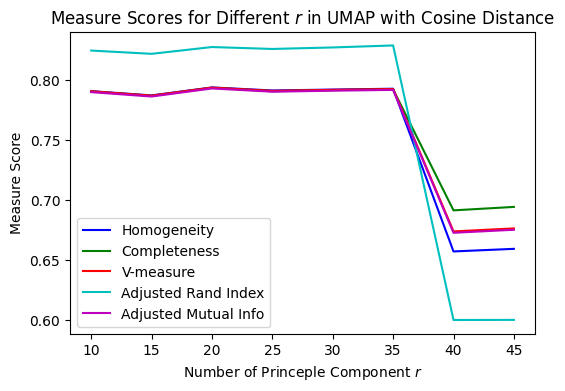

[2 2 2 5 2]
Best r for UMAP with Cosine Distance: 20
Best measures: [0.7937042425748744, 0.7934042106355329, 0.7935541982457162, 0.8273728588454262, 0.7928573558299596]


In [136]:
# Fine tune r for UMAP (cosine) when 10<r<50
bbc_metric_umap_cosine_finetune = search_best_r_umap(r_list = np.arange(10, 50, 5),
                           data = BBC_tfidf,
                           n_clusters = 5,
                           true_label = bbc_true_labels,
                           title = 'UMAP with Cosine Distance', 
                           metric = 'cosine')

#### Best feature extraction method: UMAP (cosine), r=20

In [142]:
bbc_umap_best = UMAP(n_components=20, random_state=42, metric='cosine')
BBC_reduced_tfidf = bbc_umap_best.fit_transform(BBC_tfidf)


Homogeneity:	0.793704
Completeness:	0.793404
V-measure:	0.793554
Adjusted Rand Index:	0.827373
Adjusted Mutual Info:	0.792857


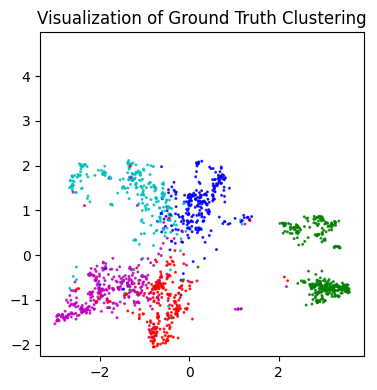

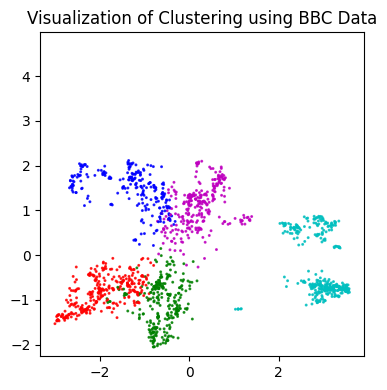

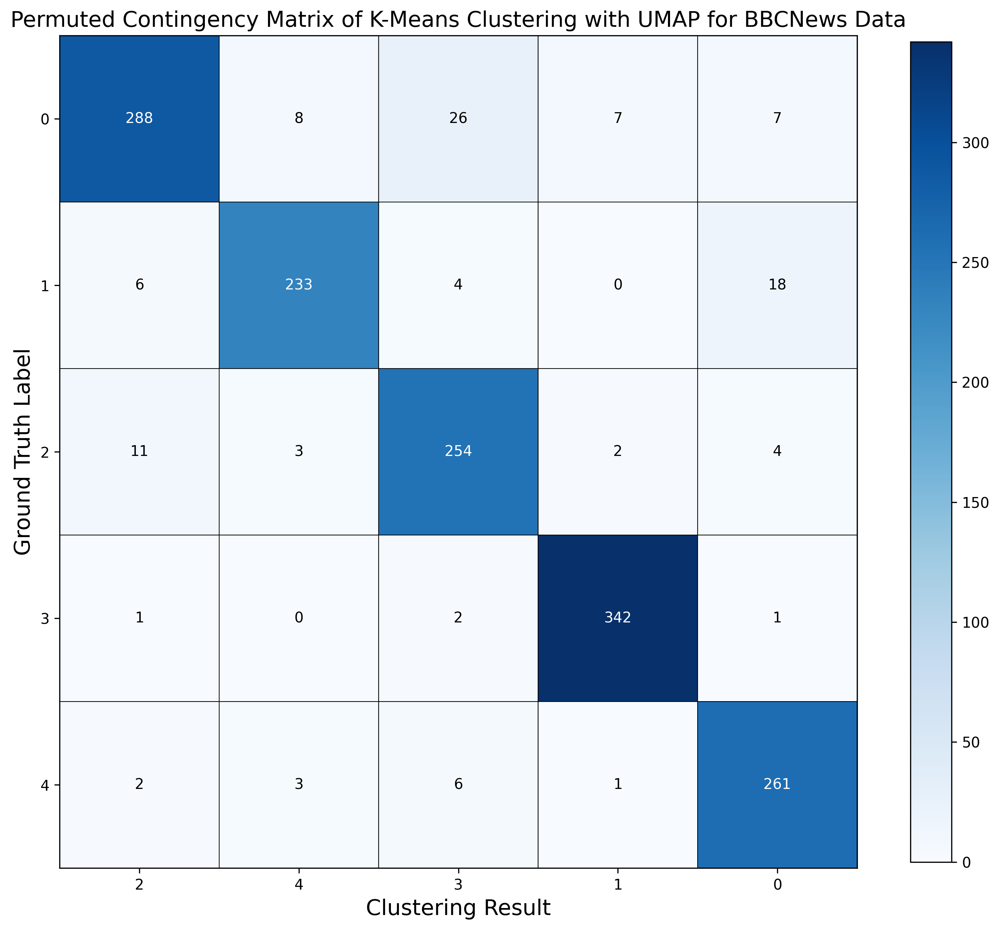

In [206]:
bbc_km = KMeans(n_clusters=5, random_state=0, max_iter=1000, n_init=30)
bbc_km = measure_model(bbc_km,
            data = BBC_reduced_tfidf,
            title_visual = 'BBC Data',
            title_contingency = 'K-Means Clustering with UMAP for BBCNews Data',
            true_label = bbc_true_labels, 
            size = (10, 9))


### Clustering

#### Agglomerative Clustering

Homogeneity:	0.774223
Completeness:	0.775315
V-measure:	0.774768
Adjusted Rand Index:	0.807436
Adjusted Mutual Info:	0.774007


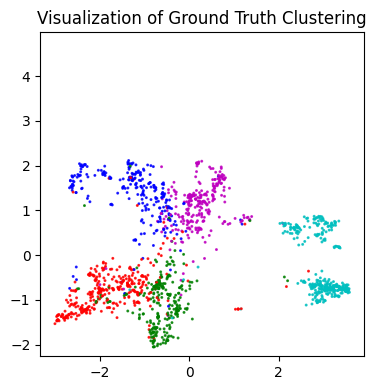

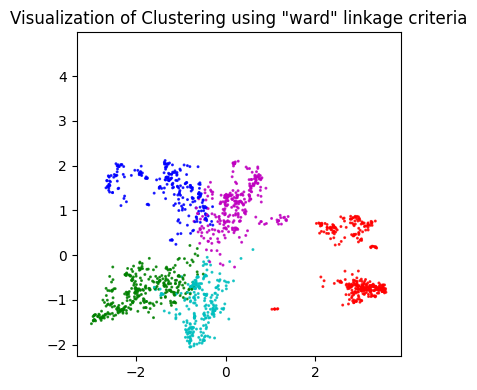

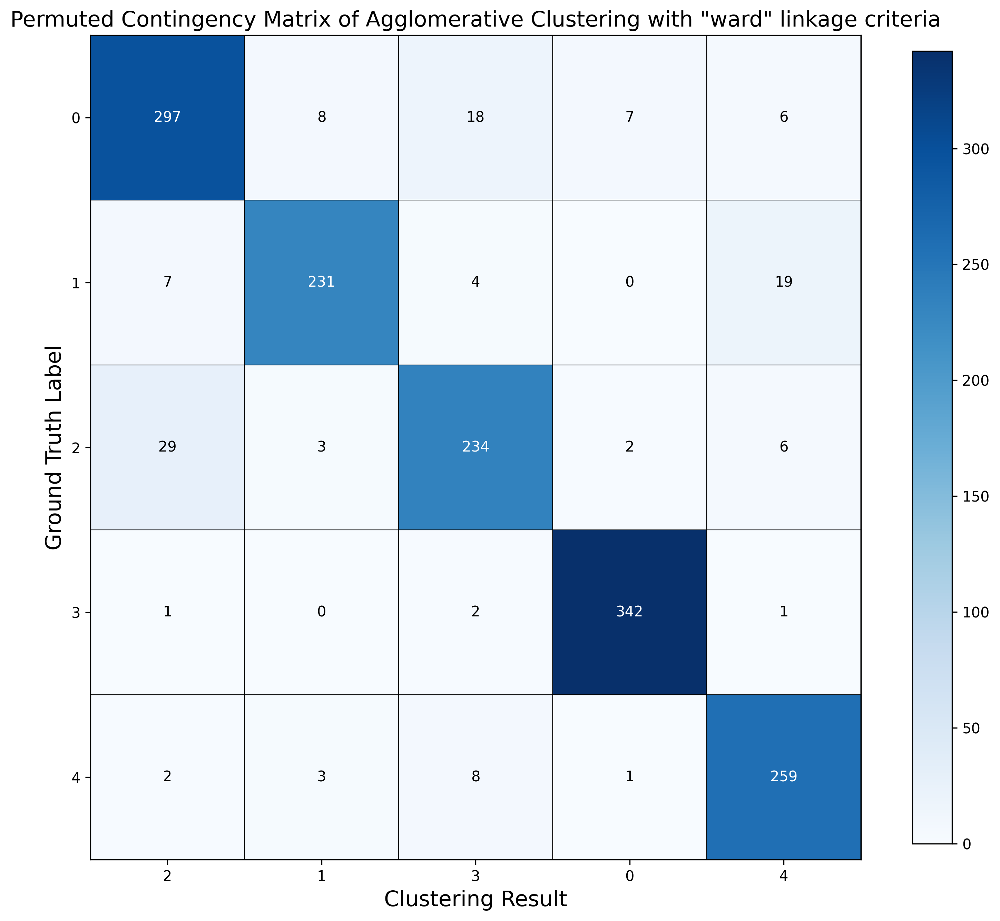

In [197]:
# linkage = 'ward'
bbc_AC_ward = AgglomerativeClustering(n_clusters=5, linkage='ward')
bbc_AC_ward = measure_model(bbc_AC_ward,
               data = BBC_reduced_tfidf,
               title_visual = '"ward" linkage criteria',
               title_contingency = 'Agglomerative Clustering with "ward" linkage criteria',
               true_label = bbc_true_labels, 
               size = (10, 9))

Homogeneity:	0.235836
Completeness:	0.573957
V-measure:	0.334307
Adjusted Rand Index:	0.117823
Adjusted Mutual Info:	0.330810


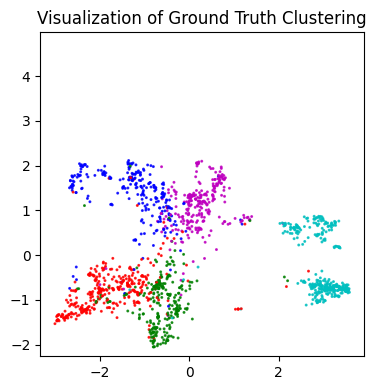

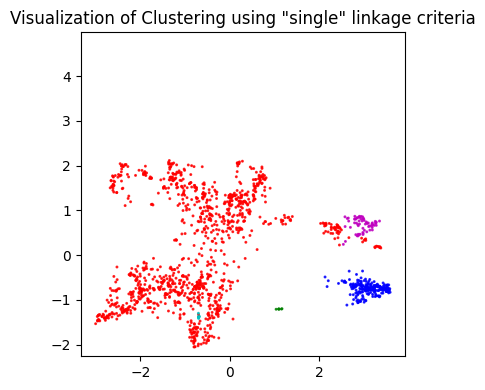

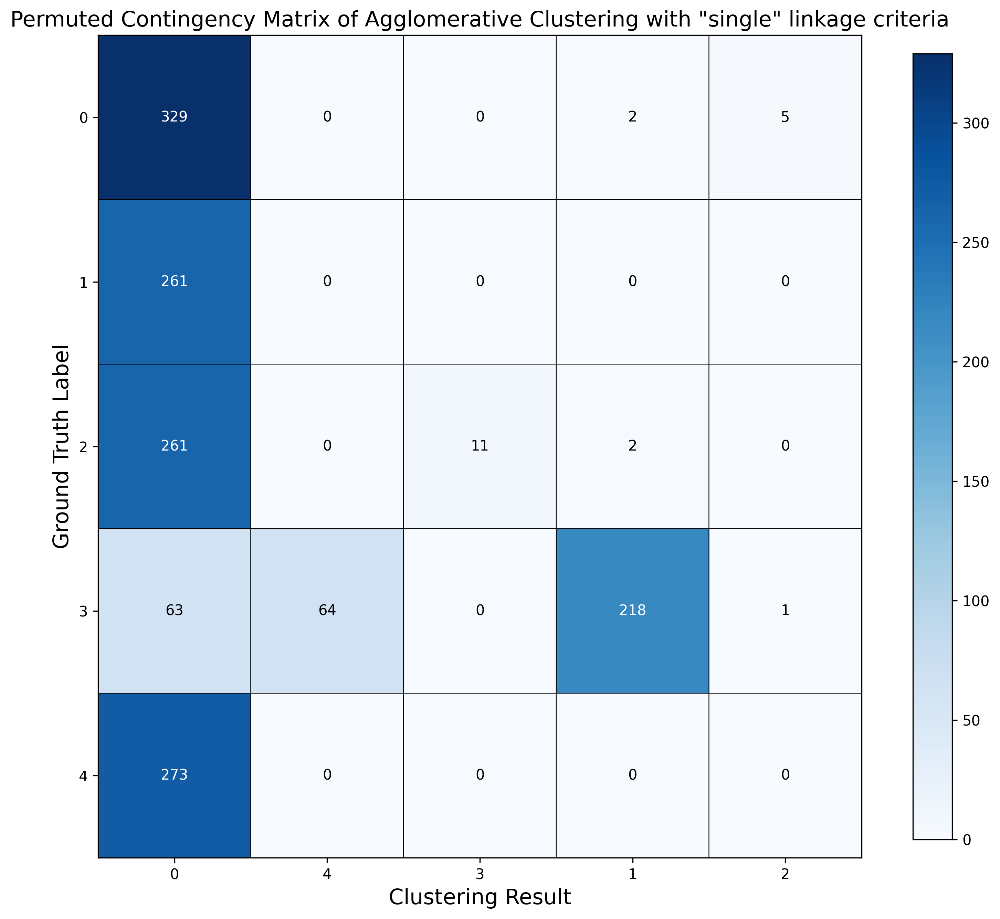

In [198]:
# linkage = 'single'
bbc_AC_single = AgglomerativeClustering(n_clusters=5, linkage='single')
bbc_AC_single = measure_model(bbc_AC_single,
                data = BBC_reduced_tfidf,
                title_visual = '"single" linkage criteria',
                title_contingency = 'Agglomerative Clustering with "single" linkage criteria',
                true_label = bbc_true_labels, 
                size = (10, 9))

#### DBSCAN

eps=0.02 is done.
eps=0.04 is done.
eps=0.06 is done.
eps=0.08 is done.
eps=0.10 is done.
eps=0.12 is done.
eps=0.14 is done.
eps=0.16 is done.
eps=0.18 is done.
eps=0.20 is done.
eps=0.22 is done.
eps=0.24 is done.
eps=0.26 is done.
eps=0.28 is done.
eps=0.30 is done.
eps=0.32 is done.
eps=0.34 is done.
eps=0.36 is done.
eps=0.38 is done.
eps=0.40 is done.
eps=0.42 is done.
eps=0.44 is done.
eps=0.46 is done.
eps=0.48 is done.
eps=0.50 is done.
[[4.15707302e-16 1.00000000e+00 8.31414605e-16 0.00000000e+00
  1.23912396e-15]
 [4.99563670e-03 2.67987190e-01 9.80843123e-03 5.26197207e-04
  7.82819009e-03]
 [3.21600496e-02 2.43331507e-01 5.68115656e-02 2.61910698e-03
  4.30607296e-02]
 [8.04766213e-02 2.45568927e-01 1.21225747e-01 9.34172370e-04
  9.49362076e-02]
 [1.78627876e-01 2.47168792e-01 2.07381784e-01 6.36395002e-04
  1.66126005e-01]
 [2.50562281e-01 2.56133948e-01 2.53317481e-01 2.64136204e-03
  2.13438297e-01]
 [3.32831112e-01 2.60534684e-01 2.92278555e-01 7.82777757e-03
  2.5158

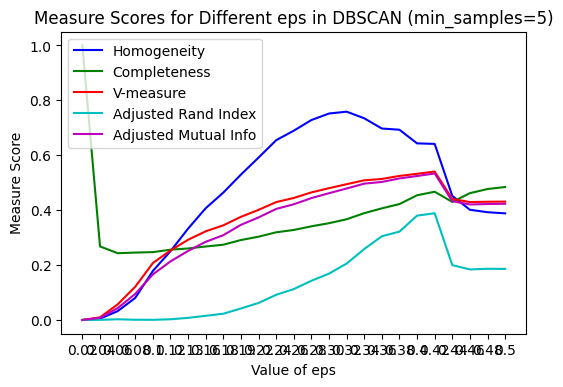

[15  0 20 20 20]
Best eps for (min_samples=5): 0.42000000000000004
Best measures: [0.6414238070613375, 0.4671250595674104, 0.5405718107721933, 0.3888714880323609, 0.533697605294652]


In [165]:
eps_list = np.arange(0.02, 0.52, 0.02)
bbc_metric_dbscan_eps_1 = search_best_eps_dbscan(eps_list = eps_list, 
                         min_samples = 5, 
                         data = BBC_reduced_tfidf, 
                         true_label = bbc_true_labels, 
                         title = '(min_samples=5)')

eps=0.50 is done.
eps=0.52 is done.
eps=0.54 is done.
eps=0.56 is done.
eps=0.58 is done.
eps=0.60 is done.
eps=0.62 is done.
eps=0.64 is done.
eps=0.66 is done.
eps=0.68 is done.
eps=0.70 is done.
eps=0.72 is done.
eps=0.74 is done.
eps=0.76 is done.
eps=0.78 is done.
eps=0.80 is done.
eps=0.82 is done.
eps=0.84 is done.
eps=0.86 is done.
eps=0.88 is done.
eps=0.90 is done.
eps=0.92 is done.
eps=0.94 is done.
eps=0.96 is done.
eps=0.98 is done.
eps=1.00 is done.
[[4.15707302e-16 1.00000000e+00 8.31414605e-16 0.00000000e+00
  1.23912396e-15]
 [4.15707302e-16 1.00000000e+00 8.31414605e-16 0.00000000e+00
  1.23912396e-15]
 [4.15707302e-16 1.00000000e+00 8.31414605e-16 0.00000000e+00
  1.23912396e-15]
 [4.15707302e-16 1.00000000e+00 8.31414605e-16 0.00000000e+00
  1.23912396e-15]
 [4.15707302e-16 1.00000000e+00 8.31414605e-16 0.00000000e+00
  1.23912396e-15]
 [4.15707302e-16 1.00000000e+00 8.31414605e-16 0.00000000e+00
  1.23912396e-15]
 [4.15707302e-16 1.00000000e+00 8.31414605e-16 0.000

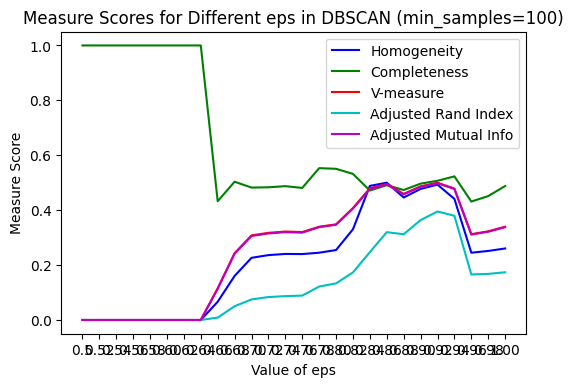

[18  0 21 21 21]
Best eps for (min_samples=100): 0.9200000000000004
Best measures: [0.4930200577624776, 0.5071180122272074, 0.499969672553769, 0.39520869361440675, 0.49825696154483895]


In [166]:
eps_list = np.arange(0.5, 1.02, 0.02)
bbc_metric_dbscan_eps_2 = search_best_eps_dbscan(eps_list = eps_list, 
                         min_samples = 100, 
                         data = BBC_reduced_tfidf, 
                         true_label = bbc_true_labels, 
                         title = '(min_samples=100)')

min_samples=3 is done.
min_samples=4 is done.
min_samples=5 is done.
min_samples=6 is done.
min_samples=7 is done.
min_samples=8 is done.
min_samples=9 is done.
min_samples=10 is done.
min_samples=11 is done.
min_samples=12 is done.
min_samples=13 is done.
min_samples=14 is done.
min_samples=15 is done.
min_samples=16 is done.
min_samples=17 is done.
min_samples=18 is done.
min_samples=19 is done.
[[6.80443707e-01 2.85760535e-01 4.02490383e-01 5.78330291e-02
  3.58008546e-01]
 [5.99533284e-01 2.88447426e-01 3.89499075e-01 4.86776366e-02
  3.53768400e-01]
 [5.29590492e-01 2.91280650e-01 3.75843308e-01 4.18968294e-02
  3.46652454e-01]
 [4.71454176e-01 2.86450024e-01 3.56372375e-01 3.24586995e-02
  3.28485230e-01]
 [3.98453023e-01 2.87271003e-01 3.33848590e-01 2.57472105e-02
  3.08951532e-01]
 [3.46568631e-01 2.90155598e-01 3.15863049e-01 1.79756270e-02
  2.93968470e-01]
 [3.14684501e-01 2.92473983e-01 3.03173000e-01 1.44984460e-02
  2.82318419e-01]
 [2.67620523e-01 2.93119958e-01 2.79790

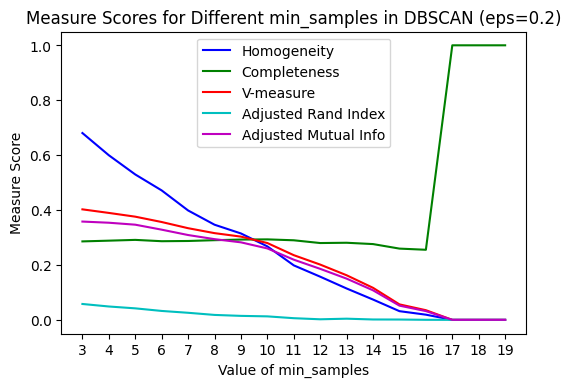

[ 0 14  0  0  0]
Best min_samples for (eps=0.2): 3
Best measures: [0.6804437069304429, 0.28576053500941107, 0.40249038308058754, 0.05783302907482875, 0.35800854610516886]


In [170]:
min_samples_list = np.arange(3, 20)
bbc_metric_dbscan_minsample_1 = search_best_minsamples_dbscan(min_samples_list = min_samples_list, 
                                eps = 0.2, 
                                data = BBC_reduced_tfidf, 
                                true_label = bbc_true_labels, 
                                title = '(eps=0.2)')

min_samples=3 is done.
min_samples=5 is done.
min_samples=7 is done.
min_samples=9 is done.
min_samples=11 is done.
min_samples=13 is done.
min_samples=15 is done.
min_samples=17 is done.
min_samples=19 is done.
min_samples=21 is done.
min_samples=23 is done.
min_samples=25 is done.
min_samples=27 is done.
min_samples=29 is done.
min_samples=31 is done.
min_samples=33 is done.
min_samples=35 is done.
min_samples=37 is done.
min_samples=39 is done.
min_samples=41 is done.
min_samples=43 is done.
min_samples=45 is done.
min_samples=47 is done.
min_samples=49 is done.
[[0.39733609 0.49467245 0.44069357 0.1863955  0.43037948]
 [0.38844769 0.48435389 0.43113155 0.18609199 0.42331449]
 [0.4131373  0.45638953 0.43368769 0.19758297 0.4277606 ]
 [0.45989623 0.43821373 0.44879325 0.20514692 0.44297064]
 [0.46449409 0.41896491 0.44055632 0.19756577 0.43435471]
 [0.61967305 0.47316161 0.53659626 0.37736466 0.53197324]
 [0.61475694 0.46656896 0.5305089  0.36926228 0.52586157]
 [0.61028064 0.4509565

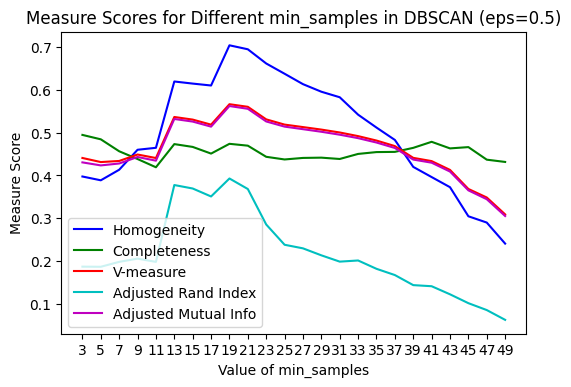

[8 0 8 8 8]
Best min_samples for (eps=0.5): 19
Best measures: [0.7043295915358055, 0.4738146687012435, 0.566520931830323, 0.392696173872397, 0.5622719439130381]


In [175]:
min_samples_list = np.arange(3, 50, 2)
bbc_metric_dbscan_minsample_2 = search_best_minsamples_dbscan(min_samples_list = min_samples_list, 
                                eps = 0.5, 
                                data = BBC_reduced_tfidf, 
                                true_label = bbc_true_labels, 
                                title = '(eps=0.5)')

Homogeneity:	0.704330
Completeness:	0.473815
V-measure:	0.566521
Adjusted Rand Index:	0.392696
Adjusted Mutual Info:	0.562272


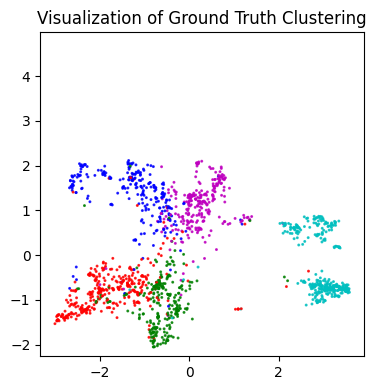

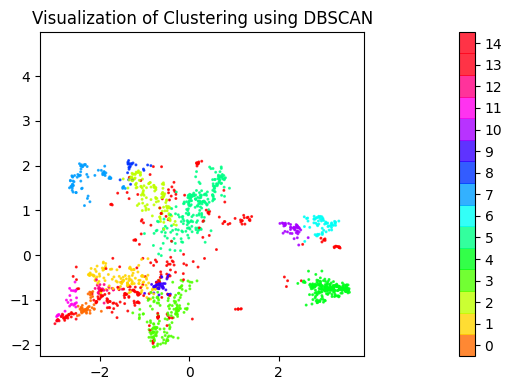

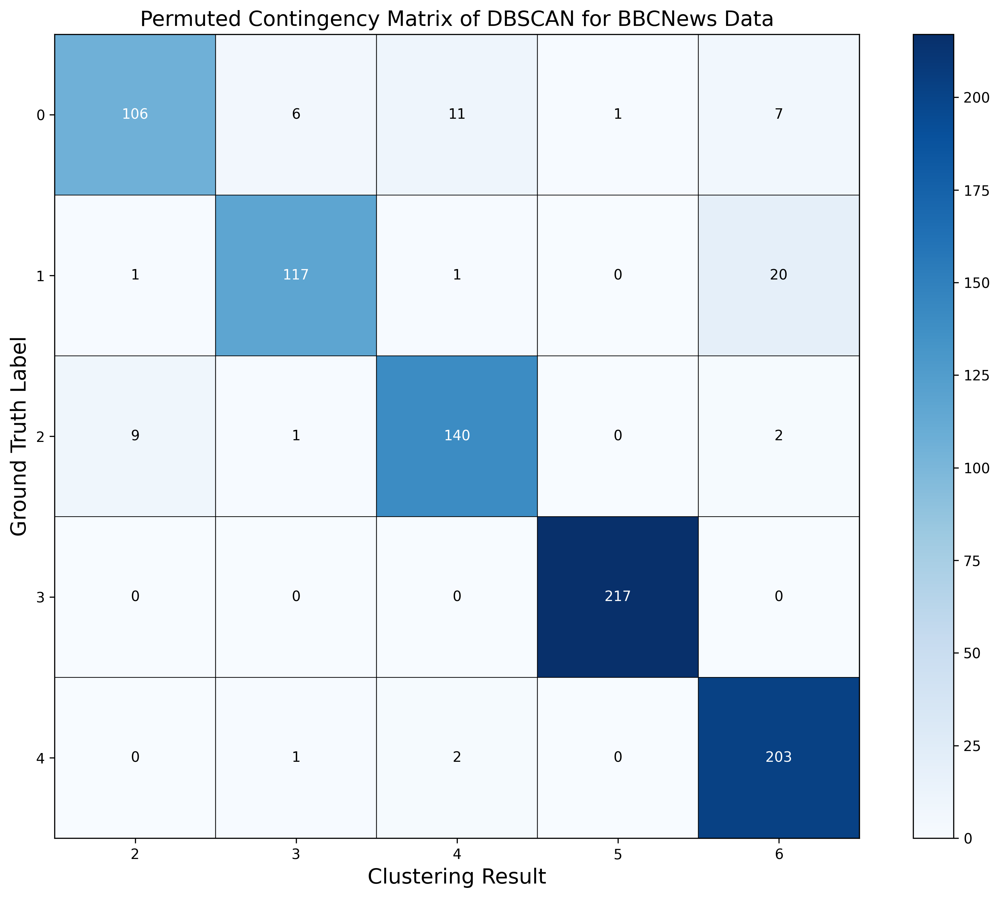

In [199]:
# Best eps for (min_samples=5): 0.42
# Best measures: [0.6414238070613375, 0.4671250595674104, 0.5405718107721933, 0.3888714880323609, 0.533697605294652]
# Best eps for (min_samples=100): 0.92
# Best measures: [0.4930200577624776, 0.5071180122272074, 0.499969672553769, 0.39520869361440675, 0.49825696154483895]
# Best min_samples for (eps=0.2): 3
# Best measures: [0.6804437069304429, 0.28576053500941107, 0.40249038308058754, 0.05783302907482875, 0.35800854610516886]
# Best min_samples for (eps=0.5): 19
# Best measures: [0.7043295915358055, 0.4738146687012435, 0.566520931830323, 0.392696173872397, 0.5622719439130381]

# Best combination for DBSCAN: eps=0.5, min_samples=19

bbc_dbscan_model = DBSCAN(eps=0.5, min_samples=19)
bbc_dbscan_model = measure_model(bbc_dbscan_model,
                 data = BBC_reduced_tfidf,
                 title_visual = 'DBSCAN',
                 title_contingency = 'DBSCAN for BBCNews Data', 
                 true_label = bbc_true_labels, 
                 size = (10, 9))

#### HDBSCAN

eps=0.02 is done.
eps=0.04 is done.
eps=0.06 is done.
eps=0.08 is done.
eps=0.10 is done.
eps=0.12 is done.
eps=0.14 is done.
eps=0.16 is done.
eps=0.18 is done.
eps=0.20 is done.
eps=0.22 is done.
eps=0.24 is done.
eps=0.26 is done.
eps=0.28 is done.
eps=0.30 is done.
eps=0.32 is done.
eps=0.34 is done.
eps=0.36 is done.
eps=0.38 is done.
eps=0.40 is done.
eps=0.42 is done.
eps=0.44 is done.
eps=0.46 is done.
eps=0.48 is done.
eps=0.50 is done.
[[0.30736284 0.63783491 0.41482695 0.23575737 0.41349205]
 [0.30736284 0.63783491 0.41482695 0.23575737 0.41349205]
 [0.30736284 0.63783491 0.41482695 0.23575737 0.41349205]
 [0.30736284 0.63783491 0.41482695 0.23575737 0.41349205]
 [0.30736284 0.63783491 0.41482695 0.23575737 0.41349205]
 [0.30736284 0.63783491 0.41482695 0.23575737 0.41349205]
 [0.30736284 0.63783491 0.41482695 0.23575737 0.41349205]
 [0.30736284 0.63783491 0.41482695 0.23575737 0.41349205]
 [0.30736284 0.63783491 0.41482695 0.23575737 0.41349205]
 [0.30736284 0.63783491 0.41

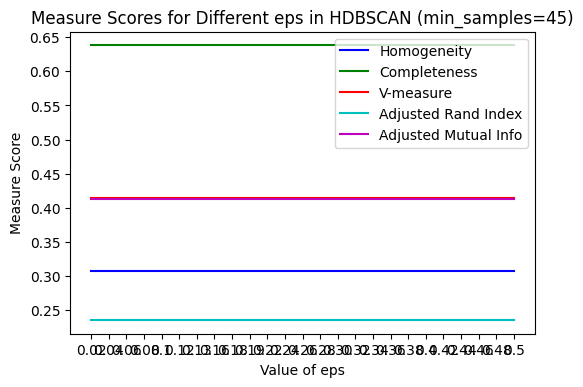

[0 0 0 0 0]
Best eps for (min_samples=45): 0.02
Best measures: [0.30736284234369665, 0.6378349125692673, 0.4148269516179409, 0.23575737101717725, 0.41349205019287816]


In [192]:
eps_list = np.arange(0.02, 0.52, 0.02)
bbc_metric_hdbscan_eps_1 = search_best_eps_hdbscan(eps_list = eps_list, 
                          min_samples = 45, 
                          data = BBC_reduced_tfidf, 
                          true_label = bbc_true_labels, 
                          title = '(min_samples=45)')

min_samples=5 is done.
min_samples=7 is done.
min_samples=9 is done.
min_samples=11 is done.
min_samples=13 is done.
min_samples=15 is done.
min_samples=17 is done.
min_samples=19 is done.
min_samples=21 is done.
min_samples=23 is done.
min_samples=25 is done.
min_samples=27 is done.
min_samples=29 is done.
min_samples=31 is done.
min_samples=33 is done.
min_samples=35 is done.
min_samples=37 is done.
min_samples=39 is done.
min_samples=41 is done.
min_samples=43 is done.
min_samples=45 is done.
min_samples=47 is done.
min_samples=49 is done.
min_samples=51 is done.
min_samples=53 is done.
min_samples=55 is done.
min_samples=57 is done.
min_samples=59 is done.
min_samples=61 is done.
min_samples=63 is done.
min_samples=65 is done.
min_samples=67 is done.
min_samples=69 is done.
[[0.16228687 0.54009635 0.24958041 0.07803648 0.24754743]
 [0.16228687 0.54009635 0.24958041 0.07803648 0.24754743]
 [0.16308531 0.53462179 0.24992998 0.0786461  0.24792333]
 [0.16318538 0.50048603 0.2461218  0.

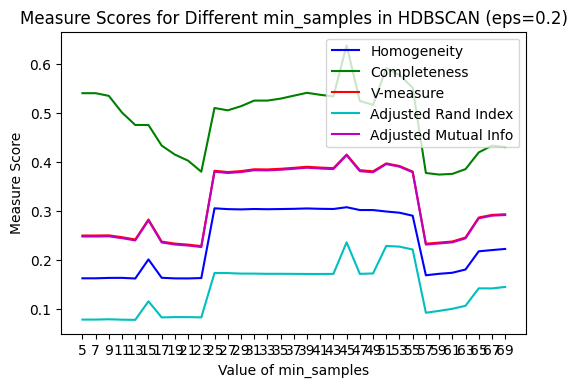

[20 20 20 20 20]
Best min_samples for (eps=0.2): 45
Best measures: [0.30736284234369665, 0.6378349125692673, 0.4148269516179409, 0.23575737101717725, 0.41349205019287816]


In [191]:
min_samples_list = np.arange(5, 70, 2)
bbc_metric_hdbscan_minsample_1 = search_best_minsamples_hdbscan(min_samples_list = min_samples_list, 
                                 eps = 0.2, 
                                 data = BBC_reduced_tfidf, 
                                 true_label = bbc_true_labels, 
                                 title = '(eps=0.2)')

Homogeneity:	0.307363
Completeness:	0.637835
V-measure:	0.414827
Adjusted Rand Index:	0.235757
Adjusted Mutual Info:	0.413492


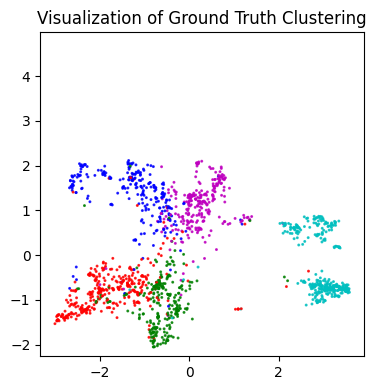

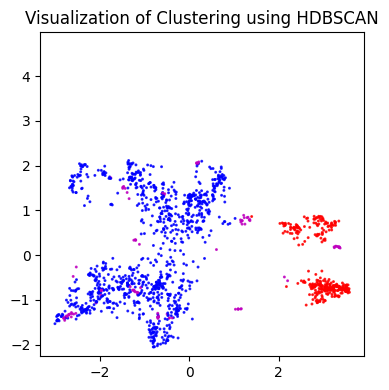

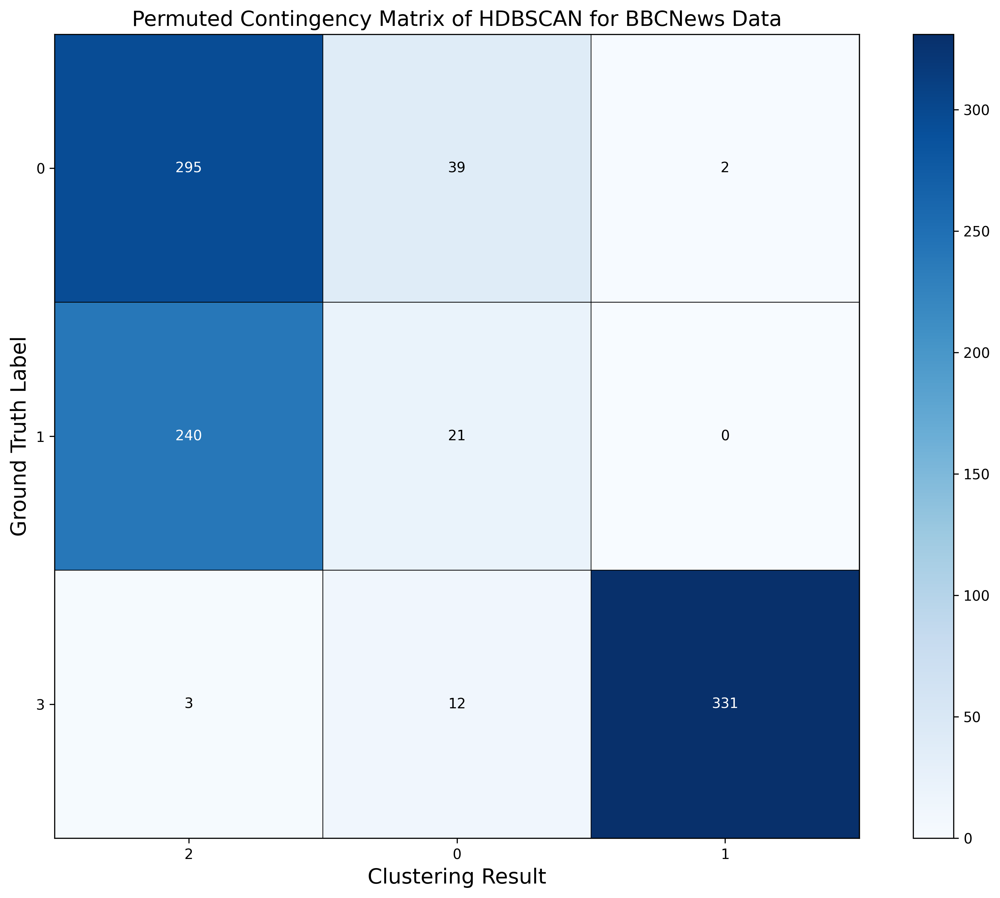

In [202]:
bbc_hdbscan_model = HDBSCAN(cluster_selection_epsilon=0.5, min_samples=45, min_cluster_size=100)
bbc_hdbscan_model = measure_model(bbc_hdbscan_model,
                 data = BBC_reduced_tfidf,
                 title_visual = 'HDBSCAN',
                 title_contingency = 'HDBSCAN for BBCNews Data', 
                 true_label = bbc_true_labels, 
                 size = (10, 9))